# Exploration of causes and impacts of wildfires in Alberta

## Final Report

December 6, 2024,

By Chandanarchutha Namburu, Franco Doi, Katelyn Siu, Paul Lin, Yaowei Sun

**Group L03-10**

# Introduction



Wildfires are a recurring environmental challenge in Alberta, Canada, with their intensity and frequency expected to increase due to climate change. The 2023 wildfire season in Alberta highlighted the severity of this issue, with record-breaking fires that resulted in extensive evacuations, significant economic losses, and substantial ecological damage. The pressing need to improve predictive models for wildfires, tailored to Alberta’s specific conditions, has become critical for effective wildfire management and mitigation (Alberta Wildfire Season ’10 Times More Severe’ than Recent Averages, Province Says | Globalnews.Ca, n.d.; Beverly & Schroeder, n.d.).

This project seeks to develop a comprehensive data-driven analysis and predictive model for wildfire occurrences in Alberta. To do so, it will leverage key datasets available through Alberta’s Open Data Portal, specifically focusing on the Build-Up Index (BUI), Initial Spread Index (ISI), historical wildfire data, vegetation cover, and the Alberta Air Quality Health Index (AQHI). The BUI and ISI provide indicators of fuel moisture and wind-driven spread potential, respectively, while vegetation cover gives insight into areas of combustible material. The AHQI will be used to assess the environmental impact of wildfires on air quality, which has become increasingly important for public health and safety.

The first step of the analysis will help reveal critical factors that contribute to fire risk and inform wildfire response. The next phase will involve cross-analyzing two or more datasets—such as vegetation cover with the BUI, or wildfire occurrences with AQHI levels—to uncover potential interactions that affect wildfire behavior. Previous studies indicate that combining these types of data can improve our understanding of wildfire dynamics and enhance prediction accuracy (Jain et al., 2020).

This comprehensive EDA will lay the groundwork for building predictive models that can assess wildfire risk across Alberta. Such models would allow for more effective allocation of resources, targeted mitigation strategies, and proactive public safety measures. Ultimately, the project aims to contribute to the field of wildfire science by providing an adaptable data-driven model that aids Alberta’s ongoing efforts to manage and respond to the evolving threat of wildfires.

# Guiding questions

To successfully perform the analysis of the causes and impacts of wildfires in Alberta and shed the north of whole project, the following guiding questions were elaborated.

## How much factors contribute to initiate a fire in the wilderness?
This guiding question will help align investigation on how much a known factor contributes to initiating a fire in the wilderness.

## What are the environmental impacts of wildfire in Alberta?
This guiding question will help align investigation on how much the environment is impacted after the wildfire is controlled.

## Is there a discernible spatial or temporal pattern in occurrence of wildfires?
This guiding question will help align investigation on patterns of wildfires, if any.


# Individual Datasets

The success of any data science project relies heavily on the quality and relevance of the datasets used. In this project, several key datasets were utilized, each contributing unique insights into wildfire behavior and risk assessment in Alberta. The following section provides a detailed description of each dataset, including its source and licensing information, the team member responsible for its handling, the dataset’s structure and format, and discussion of steps each one of the members had to take to clean or extract the data. This comprehensive overview ensures transparency in our data preparation process and highlights the critical role each dataset played in achieving the project’s objectives.

## Historical Wildfire Dataset

Time Range: 2006- 2023 | Data size: 7.3 MB   

The historical wildfire dataset describes the wildfire information in Alberta from 2006 to 2023, including the details of each fire’s cause, size, location, duration, weather conditions, staffing and physical resources used to suppress the fire, and area burned. The dataset is from Alberta government website published by Forest and Park section. The license allows us to copy, modify, publish, translate, adapt, distribute or otherwise use the Information in any medium, mode or format for any lawful purpose. (Historical Wildfire Data: 2006 to 2023 - Open Government, n.d.-b)

## Build Up Index (BUI) Dataset

**Time Range: 1979-2018 | Data size:  1.1 GB**

**Franco Doi** was assigned to this dataset, which can be found in zenodo.org under Government of Canada’s Open Government data as .nc file extension.

The Build-Up Index (BUI) is a key fire weather index that measures the cumulative effect of fuel dryness and moisture conditions in forested areas. It reflects the amount of fuel available for combustion, combining the Duff Moisture Code (DMC), which gauges moisture in moderate-depth organic material, and the Drought Code (DC), which indicates deep organic layer dryness. A higher BUI suggests drier, more flammable conditions, which significantly increase the potential intensity and spread of wildfires. By capturing the state of fuel readiness, the BUI is a critical factor in wildfire risk assessment and management strategies.

Key features of interest within dataset:
* Latitude: Latitude of the coordinate of the measured index.
* Longitude: Longitude of the coordinate of the measured index.
* Time: Time of when the measured index was collected.
* BUI: the index.

Acquisition of the dataset was challenging because was 40 years of data and on a file format that we are not used to: .nc file format. It was required to develop a custom script to convert to .zarr file format which had a built-in function to export as pandas dataframe.

Explanation of rows of the dataset:
1.	Daily measurement from 1979 to 2018 leads to total span of 40 years, meaning that 365 days x 40 years + 10 leap years is equal to 14610 rows.
2.	There is one row for each combination of latitude and longitude, and there are 18454 combinations in total, meaning that 1845 locations x 14610 daily measurements are equivalent to 26,955,450 rows.

A key characteristic of this dataset is the seasonality of wildfires, which whenever the wildfire season is declared ended or not started, all daily values are set to 0. This is handled by applying time series outlier handling techniques, listed below:
* Calculate a multi-year rolling average to replace 0 with rolling average of 3 years of data.
* Interpolation to estimate values not replaced by multi-year rolling average due big gaps or not having enough data.
* Next Observation Carried Backward (NOCB) to fill the first months of the first year by copying the value of the first day of fire season to the other days, keeping the average.

Due to the size of the dataset, performance of the queries using this dataset was always a concern, which was handled by creating table index and query optimization.

Another technique utilized is creation of tables from select with following objectives:
1.	Visually simplify a complex query by querying form the table instead of a big query. The result are the same, but it is easier to read.
2.	Speed up query by selecting a table with compiled query and creating index to the created tables.
3.	Allowing validating each part of a complex query by analysing result of each created table.

## Initial Spread Index (ISI) Dataset

**Time Range: 1979 - 2018 | Data size: 14 MB**

**Paul** is responsible for this dataset. This dataset was developed by Natural Resources Canada using the European Centre for Medium-range Weather Forecasts (ECMWF) ERA5-HRS Reanalysis product (C3S, 2017) as inputs to the Canadian Forest Fire Danger Rating System R Package (Wang et al. 2017).

Key features of interest within dataset:
* Latitude: Latitude of the coordinate of the measured index.
* Longitude: Longitude of the coordinate of the measured index.
* Time: Time of when the measured index was collected.
* ISI index: The index is a numeric rating of the expected rate of fire spread.

This data provides potential risk of various locations. We extract the dataset from the whole of North America down to only Alberta. It been processed with python to transfer from nc type dimensions data type to data frame.

By visualizing the index in heatmap, we found there are some patterns that happen every year. We also make the trend plot with the average area of Alberta.
* The ISI index arises over 1 from May to September provides conditions for wildfires to spread.
* The safety place mostly exists in the plain area instead of mountain or forest.

These insightful findings help us better understand the potential risk aspect of wildfires in Alberta.


## Air Quality Health Index (AQHI) Dataset

**Time Range:  2016 – 2024 | Data size:  112 MB**

The dataset is obtained from the Alberta Government portal(https://airquality.alberta.ca/map), it contains community-wise Air Quality Health Index (AQHI) data. Initially, there were 47 individual CSV files, each representing a different community. These files were merged into a single dataset, resulting in a CSV file with 666,426 records and 18 columns. In addition, there is another CSV file called stations_locations, which contains the location coordinates of these 47 communities. The dataset is under the copyright act. https://www.alberta.ca/

Key attributes of interest within dataset:
* Value: The AQHI value of the community on a given ReadingDate.
* CommunityName: The name of the community to which the data corresponds.
* ReadingDate: The date and time when the readings were recorded.

Team member responsible for the dataset: Chandanarchutha Namburu.

While I did not face any noteworthy challenges with this specific dataset, it took significant time to explore and to properly understand its structure. Deciding which columns to keep and which to drop was a time-consuming process, as I needed to ensure that only relevant data was retained for analysis. I believe similar challenges of data exploration and cleaning would be encountered with any dataset.


## National Forestry Database

**Time Range: 1990 - 2020 | Data size: 77.3 MB**

To investigate the environmental impact of wildfires, it is essential to focus on vegetation. We have decided to analyze data on forest cover across Alberta to gain insights into the influence of wildfires on the region’s ecosystems. The National Forestry Database (NFD), which provides extensive information on Canada’s forests which is publicly accessible under the Open Government License – Canada (version 2.0). Upon downloading the dataset, we found over 100 CSV and Excel files categorized into various topics such as Wood Supply, Forest Fires, and Defoliation by Insects. For this analysis, however, we will concentrate specifically on data related to **Forest Area and Distribution**. This data will allow us to identify wildfire-affected areas, as well as analyze the timing and causes of these fires on a month-by-month basis. Given that this is a national dataset, we will refine and consolidate the data to focus specifically on Alberta based on our topic. Relevant variables will be integrated into a single file to facilitate alignment with other useful datasets contributed by team members.


# Data Exploration

Data exploration is a vital step in understanding the datasets and preparing them for analysis and modeling. In this project, we conducted thorough exploratory data analysis (EDA) to uncover patterns, trends, and relationships in the data while addressing any inconsistencies or missing values. The following section details the specific tasks undertaken, including how each dataset was cleaned to ensure reliability, the insights gained from individual data exploration, and the process of integrating datasets through additional cleaning and querying. These steps were crucial in creating a cohesive and high-quality dataset to drive the subsequent phases of the project.

## Database and chosen technologies

*	Azure MySQL database was chosen as single database instance for the project to facilitate cross-dataset analysis, even though is not free, the team member as credit with the university’s login.
*	Python and third-party libraries will be the primary tool.

## Data Collection

*	All data will be collected from open data set from Canada and Alberta except items below.
*	AQHI and location of air quality stations in Alberta is collected via web scraping from https://airquality.alberta.ca/map.
*	zenodo.org, which collected data from Canada Open data.


## Data Preprocessing

### Historical Wildfire

This dataset doesn't involve much preprocessing.The data comprehensively records the details of each wildfire occurrence. We have fully uploaded all the data into the database. We select columns that we need by using queries when we doing the specific question.

### Build Up Index (BUI)

The **data cleaning** process for BUI dataset was done in the sequence below:

**Step 1**. Downloaded each dataset available.
Script was made available by McElhinny, Megan, et al, customized to only download overwintered BUI dataset.

**Step 2**. Converted each .nc file to .zarr and dataframe.
Using script developed by Paul Lin, team member.[(nc_operation)](https://github.com/PaulYYLin/Initial-Spread-Index-Wildifre/blob/main/nc_operation.py)

**Step 3**. Handled outliers.
The 0s are defined as off wildfire season and the values are never calculated.
The solution was to estimate the values based on rolling average of 3 years of data, interpolation and filling with Next Observation Carried Backward as last resource.
1.	Set BUI with 0 value as NaN.
2.	Calculate a multi-year rolling average to replace 0 with rolling average of 3 years of data.
3.	Interpolation to estimate values not replaced by multi-year rolling average due big gaps or not having enough data.
4.	Next Observation Carried Backward (NOCB) to fill the first months of the first year by copying the value of the first day of fire season to the other days, keeping the average.


### Initial Spread Index (ISI)

The data cleaning process for ISI dataset is same as BUI dataset step 1 & 2.

Step3 is to fill all NA values with zero. It is meaningless value but it need to be included for complete the grid map.


### Air Quality Health Index (AQHI)

After merging all 47 individual community files into a single dataset, the final dataset had approximately 666,426 entries with 18 columns. However, there were 7 columns with null values. The dataset originally spanned from 2016 to 2024, but after removing records with null values, only data from 2023 and 2024 remained.


o visualize the null values, I used a heatmap, which provided some interesting insights. Except for the OdourMessage column, the remaining 6 columns with null values displayed a similar pattern in the heatmap. This suggested that the missing values in these columns came from the same records, indicating that even if some columns are dependent on others, we cannot fill in missing values based solely on that dependency.



The columns with null values were:

DeterminantParameterKey
Value
DeterminantParameterName
AqhiStatus
GeneralPopulationMessage
AtRiskMessage
OdourMessage


Among these 7 columns, Value and AqhiStatus were critical for analysis, so I kept these and dropped the other columns with null values, along with other unnecessary columns. I also removed records with null values in the Value and AqhiStatus columns, as I wanted to preserve the dataset's integrity.


Since this is real-world data, I didn not remove outliers from the Value column because extreme AQHI Values might be during wildfires.
There were no duplicate records in the dataset.

For the AqhiStatus column, values from 1 to 10 were categorized as 1, 2, 3, 4, ... 10, but values above 10 were labeled as "10+". To simplify the analysis, I changed these values to 11.

Next, I converted the ReadingDate column into the appropriate datetime format. Since the focus of the analysis is on seasonal changes in AQHI, time zones were not considered an issue, as all data is from Alberta. I checked for any invalid rows after the conversion and found that there were none.

Lastly, I split the ReadingDate into date and time columns, enabling the ability to perform both hourly and daily analysis.

After cleaning, the final data frame contains 353,831 records and 10 columns.




### National Forestry

## High level Exploratory Data Analysis (EDA) Analysis

Times Series, geospatial and cross-analysis of two or more datasets by the features will be the focus of analysis.
The timeframe for the integration of datasets will be determined by the availability of each dataset.

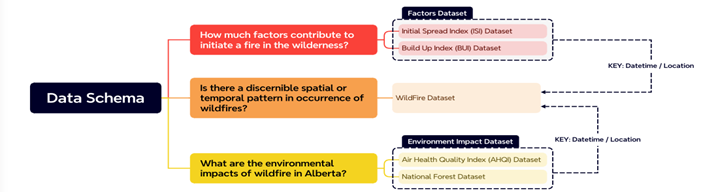

## Exploration of causes and impacts of wildfires in Alberta

Wildfires are a recurring environmental challenge in Alberta, Canada, with their intensity and frequency expected to increase due to climate change. The 2023 wildfire season in Alberta highlighted the severity of this issue, with record-breaking fires that resulted in extensive evacuations, significant economic losses, and substantial ecological damage. The pressing need to improve predictive models for wildfires, tailored to Alberta’s specific conditions, has become critical for effective wildfire management and mitigation ​(Alberta Wildfire Season ’10 Times More Severe’ than Recent Averages, Province Says | Globalnews.Ca, n.d.; Beverly & Schroeder, n.d.)​.



### Connect to Database

In [ ]:
! pip install sqlalchemy mysql mysql-connector-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.1/91.1 kB 4.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 13.2 MB/s eta 0:00:00
  Created wheel for mysqlclient: filename=mysqlclient-2.2.6-cp310-cp310-linux_x86_64.whl size=125245 sha256=cca51e87f9f04575f27f1a9905d7f44caef8c7c814449f7d0acb2ea906b9e7b4
  Stored in directory: /root/.cache/pip/wheels/c0/95/75/9ec8105309b2316e3e5eb4d3f661fa392f1bef34597232cef9
Successfully built mysqlclient


In [ ]:
PASSWORD='Password!!'
HOST='data604-project.mysql.database.azure.com'
DATABASE='project_dataset'
USER_='data604'

In [ ]:
# Connect to SQL Database
# Database Secret are stored in .env File
import pandas as pd
from sqlalchemy import create_engine, orm, func, text
import os

URI = f'mysql+mysqlconnector://{USER_}:{PASSWORD}@{HOST}:3306/{DATABASE}'
engine = create_engine(URI)

try:
    with engine.connect() as connection:
        print("Connection successful!")
except Exception as e:
    print(f"Connection failed: {e}")


Connection successful!


## Cause of WildFire Analysis

### Correlation matrix of BUI, ISI and historic wildfire

A correlation matrix provides a comprehensive overview of the relationships between key variables, enabling us to identify patterns and dependencies that influence wildfire behavior. In this project, we analyze the correlations between several critical features, including the average Build-Up Index (BUI) and Initial Spread Index (ISI) measured before, during, and after wildfires; the duration of wildfires, calculated from ignition to extinction; and the total hectares burned upon extinction. By examining these relationships, we aim to uncover how fire weather indices and wildfire characteristics interact, offering insights into the factors that drive wildfire intensity and duration. This analysis is fundamental for improving risk prediction and refining management strategies.

The intensity is measured by BUI, ISI index and total hectares burned. The duration is measured by the duration of wildfires.

Upon visual confirmation provided in ` Geographical distributions of BUI, ISI measurements and wildfire locations datasets`, the next step is calculating the correlation matrix to uncover the relationship between key variables.


#### Additional cleaning

Additional cleaning was required to obtain the best quality data.

In [ ]:
import mysql.connector
import sqlalchemy as sq
user='data604'
password='Password!!'
host='data604-project.mysql.database.azure.com'
database='project_dataset'
port=3306

def get_azure_db_connection():
    return mysql.connector.connect(
        user=user,
        password=password,
        host=host,
        database=database
)

def get_azure_engine() -> sq.Engine:
    return sq.create_engine(f'mysql+mysqlconnector://{user}:{password}@{host}:{port}/{database}')

##### ISI Dataset

ISI dataset just like BUI, had a meaningful number of days which index was 0 because was during off wildfire season and values are never calculated.

The solution was to estimate the values based on rolling average of 3 years of data, interpolation and filling with Next Observation Carried Backward as last resource.
1.	Set BUI with 0 value as Nan
2.	Calculate a multi-year rolling average to replace 0 with rolling average of 3 years of data.
3.	Interpolation to estimate values not replaced by multi-year rolling average due big gaps or not having enough data.
4.	Next Observation Carried Backward (NOCB) to fill the first months of the first year by copying the value of the first day of fire season to the other days, keeping the average.

The resulting dataset was then uploaded to database with table named isi_daily_data_copy.

To speed up queries, an index was added to the recently created table.


In [ ]:
import pandas as pd
engine = get_azure_engine()
isi_daily_df = pd.read_sql_table('isi_daily_data',con=engine)
engine.dispose()

In [ ]:
import numpy as np
isi_daily_df.drop(columns=['my_row_id'], inplace=True)
isi_daily_df[['Latitude', 'Longitude', 'ISI']] = isi_daily_df[['Latitude', 'Longitude', 'ISI']].apply(pd.to_numeric, downcast='float')
isi_daily_df.rename(columns={'Latitude': 'latitude', 'Longitude': 'longitude', 'Time': 'collected_time', 'ISI': 'isi'}, inplace=True)
isi_daily_df.set_index('collected_time', inplace=True)
isi_daily_df.sort_index(inplace=True)

# replace 0 (known outlier) with NaN
isi_daily_df['isi'] = isi_daily_df['isi'].replace(0, np.nan)
# Calculate a multi-year rolling average
isi_daily_df['isi'] = isi_daily_df['isi'].fillna(isi_daily_df['isi'].rolling(window=365 * 3, min_periods=1, center=True).mean())
# apply interpolate
isi_daily_df['isi'] = isi_daily_df['isi'].interpolate(method='time')
# apply Next Observation Carried Backward (NOCB)
isi_daily_df['isi'] = isi_daily_df['isi'].bfill()
isi_daily_df.reset_index(inplace=True)

In [ ]:
engine = get_azure_engine()
isi_daily_df.to_sql('isi_daily_data_copy', con=engine, if_exists='replace',chunksize=10000, index=False)
engine.dispose()

In [ ]:
query = """
alter table isi_daily_data_copy add index idx1 (collected_time,latitude,longitude);
"""
with get_azure_db_connection() as conn:
    with conn.cursor() as cursor:
        cursor.execute(query)

##### Historical Wildfire

The historical wildfire dataset contained errors in the fire_start_date field, with incorrect year values that led to miscalculations of wildfire durations, often recording them as years instead of days. Even though cannot be proven, the impression given was that due manual input during wildfire season, the target feature fire_start_date was wrongly selected and never corrected because generally the month and days match the other date features except by the year.
The target year used as reference was the year from reported_date. The only day that was set as February 29th was set to February 28th.

To enable indexing feature fire_number, the datatype was moved from TEXT to VARCHAR with size as longest fire_number.

The resulting dataset was then uploaded to database with table named historical_wildfire_copy.

To speed up queries, an index was added to the recently created table.

In [ ]:
engine = get_azure_engine()
historical_wildfire_df = pd.read_sql_table('historical-wildfire', con=engine)
historical_wildfire_df.drop(columns=['my_row_id'], inplace=True)

In [ ]:
import pandas as pd
from sqlalchemy import String

# convert the two target columns as datetime, in case parse_dates doesn't work
historical_wildfire_df['fire_start_date'] = pd.to_datetime(historical_wildfire_df['fire_start_date'],errors='coerce')
historical_wildfire_df['ex_fs_date'] = pd.to_datetime(historical_wildfire_df['ex_fs_date'],errors='coerce')
historical_wildfire_df['reported_date']= pd.to_datetime(historical_wildfire_df['reported_date'],errors='coerce')

# truncate the datetime to date only
historical_wildfire_df['ex_fs_date']  = historical_wildfire_df['ex_fs_date'].dt.normalize()

# fill null fire_start_date with reported_date
historical_wildfire_df["fire_start_date"] = historical_wildfire_df["fire_start_date"].fillna(historical_wildfire_df["reported_date"])


# Safely modify year, avoiding invalid dates
def safe_replace_year(row):
    try:
        return row["fire_start_date"].replace(year=row["reported_date"].year)
    except ValueError:  # Handle leap year issue
        print(f'{row["fire_start_date"]} cant be assigned to year {row["reported_date"].year}. converting to 02-28')
        return pd.Timestamp(f"{row['reported_date'].year}-02-28")

# mask to find fire_start_date with invalid years, which should be same as fire_year
mask = historical_wildfire_df["fire_start_date"].dt.year != historical_wildfire_df["reported_date"].dt.year

# Update only the rows where the mask is True
historical_wildfire_df.loc[mask,"fire_start_date"] = historical_wildfire_df.apply(safe_replace_year, axis=1)

# truncate the datetime to date only
historical_wildfire_df['fire_start_date'] = historical_wildfire_df['fire_start_date'].dt.normalize()

# calculate the days elapsed between started and extinguished and round up to 1.
historical_wildfire_df['wildfire_duration'] = (historical_wildfire_df['ex_fs_date'] - historical_wildfire_df['fire_start_date']).dt.days +1
max_length = historical_wildfire_df['fire_number'].astype(str).apply(len).max()

# load the table
engine = get_azure_engine()
dtype = {
    'fire_number': String(max_length)
}
historical_wildfire_df.to_sql('historical_wildfire_copy', engine, if_exists='replace',chunksize=10000, index=False, dtype=dtype)
engine.dispose()

query = """
alter table historical_wildfire_copy add index idx1 (
fire_start_date,
ex_fs_date,
fire_location_latitude,
fire_location_longitude,
wildfire_duration);
"""
with get_azure_db_connection() as conn:
    with conn.cursor() as cursor:
        cursor.execute(query)

#### Joins

The BUI, ISI and Historical wildfire datasets were joined by geographical location and the period with objective to map BUI and ISI indexes before, during and after wildfires.

The logical representation of the joins is described in the diagram below

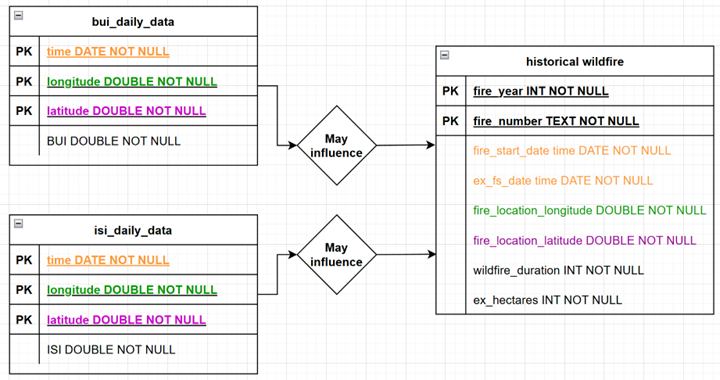

*Figure: logical representation of the joins, combined by color*

**Geographical locations were joined by green and purple colors.**

Because BUI and ISI had the same fixed locations distributed as grid and wildfires as locations that they happened, the wildfires were attributed to the closest location of a BUI and ISI.

**Period were joined by orange colors.**

The period of a wildfire was determined as between fire_start_date, which according to the metadata, is when the wildfire started, and ex_fs_date, which according to the metadata, is when the wildfire was declared extinct.

To produce balanced samples, the period before and after is determined as same period that a wildfire was active. For example, if a wildfire’s duration is 1 day, the indexes are also collected 1 day before and after the wildfire. If a wildfire’s duration is 50 days, the indexes are also collected 50 days before and after the wildfire.


In [ ]:
query = """
create table bui_isi as
select
 b.collected_time, b.latitude, b.longitude, b.bui, i.isi
from bui_daily b
join isi_daily_data_copy i
  on i.collected_time = b.collected_time
 and i.latitude = b.latitude
 and i.longitude = b.longitude;
"""
with get_azure_db_connection() as conn:
    with conn.cursor() as cursor:
        cursor.execute(query)
query = """
alter table bui_isi add index idx1 (collected_time, latitude, longitude)
"""
with get_azure_db_connection() as conn:
    with conn.cursor() as cursor:
        cursor.execute(query)

In [ ]:
query = """
create table bui_isi_wildfire as
select
    b.collected_time,
    b.latitude,
    b.longitude,
    b.bui,
    b.isi,
    w.fire_year,
    w.fire_number,
    w.fire_location_latitude,
    w.fire_location_longitude,
    w.fire_start_date,
    w.ex_fs_date,
    w.ex_hectares,
    w.wildfire_duration,
    abs(b.latitude - w.fire_location_latitude) lat_diff,
    abs(b.longitude - w.fire_location_longitude) lon_diff
from bui_isi b
join historical_wildfire_copy w
  on  b.collected_time >= date_sub(w.fire_start_date, INTERVAL w.wildfire_duration DAY)
 and b.collected_time <= date_add(w.ex_fs_date, INTERVAL w.wildfire_duration DAY)
 and abs(b.latitude - w.fire_location_latitude) < 0.125
 and abs(b.longitude - w.fire_location_longitude) < 0.125;
"""
with get_azure_db_connection() as conn:
    with conn.cursor() as cursor:
        cursor.execute(query)

query = """
alter table bui_isi_wildfire add index idx1 ( fire_year, fire_number);
"""
with get_azure_db_connection() as conn:
    with conn.cursor() as cursor:
        cursor.execute(query)

In [ ]:
query = """
create table bui_isi_wildfire_targets as
select
	fire_year,
	fire_number,
	wildfire_duration,
	count(1) actual
from bui_isi_wildfire
group by fire_year, fire_number, wildfire_duration
having actual = wildfire_duration * 3
order by fire_year, fire_number;
"""
with get_azure_db_connection() as conn:
    with conn.cursor() as cursor:
        cursor.execute(query)

In [ ]:
import pandas as pd
engine = get_azure_engine()
query = """
select
    w.fire_year,
    w.fire_number ,
    w.fire_start_date,
    w.ex_fs_date,
    w.collected_time,
    w.bui,
    w.isi,
    w.latitude,
    w.fire_location_latitude,
    w.lat_diff,
    w.longitude,
    w.fire_location_longitude,
    w.lon_diff,
    w.wildfire_duration,
    w.ex_hectares
from bui_isi_wildfire w
join bui_isi_wildfire_targets t
  on t.fire_year = w.fire_year
 and t.fire_number = w.fire_number
order by w.fire_year , w.fire_number, w.collected_time;
"""
bui_isi_wildfire_final_df = pd.read_sql_query(query, engine)
bui_isi_wildfire_final_df['collected_time'] = pd.to_datetime(bui_isi_wildfire_final_df['collected_time']).dt.normalize()
engine.dispose()

In [ ]:
# Categorize each row
def classify_period(row):
    if row['collected_time'] < row['fire_start_date']:
        return 'Before Wildfire'
    elif row['collected_time'] <= row['ex_fs_date']:
        return 'During Wildfire'
    else:
        return 'After Wildfire'

bui_isi_wildfire_final_df['period_classification'] = bui_isi_wildfire_final_df.apply(classify_period, axis=1)

In [ ]:
engine = get_azure_engine()
bui_isi_wildfire_final_df.to_sql('bui_isi_wildfire_final', engine, if_exists='replace', index=False, chunksize=10000)
engine.dispose()

#### Hot Encoding and final table

The resulting dataset of the join described above is that each wildfire instance is described in one row, and each index measurement is described per row, meaning that the wildfires are duplicated for each index measurement, making datasets on different base.

An additional feature was added with values “Before Wildfire”, “During Wildfire” and “After Wildfire” to group the measurements by before wildfire was started, the period of when wildfire was active and after wildfire was extinguished.

Since the objective is to understand correlation between causes of wildfire, the period labelled as “After Wildfire” was discarded and the resulting labels were transformed into columns using one hot encoding technique.

The new features were called period_before and period_during. The resulting values were:
*	For column period_before: “Before Wildfire” is 1 and “During Wildfire” as 0.
*	For column period_during: “Before Wildfire” is 0 and “During Wildfire” as 1.


In [ ]:
import pandas as pd
engine = get_azure_engine()
query = """
select bui, isi, latitude, longitude, period_classification
 from bui_isi_wildfire_final
where period_classification in('Before Wildfire','During Wildfire');
"""
logistic_regression_wildfire_df = pd.read_sql_query(query, engine)
engine.dispose()

In [ ]:
from sklearn.preprocessing import OneHotEncoder
# df_subset = bui_isi_wildfire_final_df.copy()
# df_subset['period_classification'] = df_subset['period_classification'].str.replace(' ','')

encoder = OneHotEncoder()
encoded_data = encoder.fit_transform(logistic_regression_wildfire_df[['period_classification']]).toarray()
# Convert the result to a DataFrame and get the column names
encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out(['period_classification']))

# Add the new columns to the original DataFrame
logistic_regression_wildfire_df = pd.concat([logistic_regression_wildfire_df, encoded_df], axis=1)
logistic_regression_wildfire_df.rename(columns={
    'period_classification_Before Wildfire':'period_before',
    'period_classification_During Wildfire':'period_during',
}, inplace=True)

#### The Correlation matrix

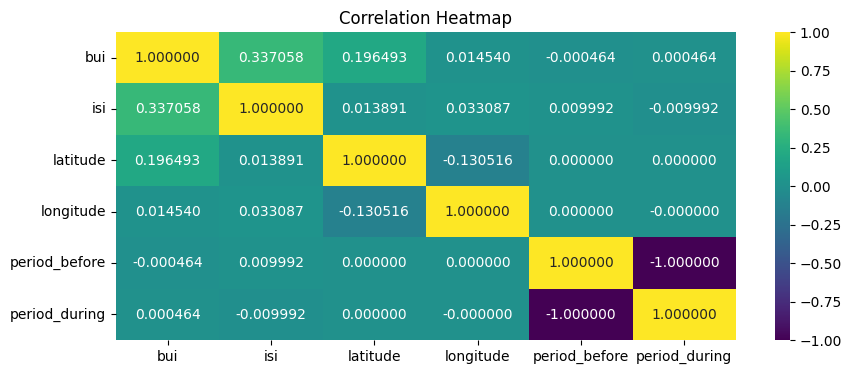

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

corr_df = logistic_regression_wildfire_df[['bui','isi','latitude','longitude','period_before','period_during']].copy()

# Calculate the correlation matrix, only for bui and fwi
correlation_matrix = corr_df.select_dtypes(include=['number']).corr()

# Create the heatmap
plt.figure(figsize=(10, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".6f")
plt.title('Correlation Heatmap')
plt.show()

#### Key findings

**1.	Features with high correlation:**

The correlation matrix heatmap shows that only period_before and period_during have high correlation, which is expected as they were transformed as one hot encoding.

**2.	Features with weak correlation:**

The correlation matrix heatmap shows that BUI, ISI, latitude and longitude have low correlation with all other features.

#### Conclusion

By having weak correlation between BUI, ISI, latitude and longitude, it indicates that the features are good candidates for logistic regression.

### Initial Spread Index Area vs Wildfire Location Overlapping Analysis


#### Key findings


1.	**High-Risk Areas**:

•	The western and central regions of Alberta, show consistently high ISI values (red zones) across several years. These areas align with dense wildfire occurrences, indicating significant fire spread potential.

2.	**Low-Risk Areas**:

•	The eastern plains and southern regions exhibit consistently lower ISI values (yellow to light orange zones) across all years. Wildfires are sparse or absent in these regions, marking them as safer zones for citizens during fire-prone months.

3.	**Temporal Variability**:

Fire-prone areas shift slightly year-to-year due to varying climate conditions. Years like 2011, 2015, and 2018 show widespread high ISI regions, while 2014 and 2016 exhibit subdued ISI values and fewer fire occurrences.

4.	**Correlations Between ISI and Wildfire Locations**:

Most wildfires occur in regions with medium to high ISI values, underscoring the importance of ISI as an effective indicator of fire spread risk. However, occasional wildfires in low ISI areas suggest that other factors, such as ignition sources or wind, also contribute to fire risk.

#### Conclusion

The analysis of the ISI index and wildfire occurrences provides crucial safety insights for Alberta citizens during the wildfire season. The eastern and southeastern parts of Alberta consistently show lower ISI values and fewer wildfire occurrences, making them the safest zones for refuge. Conversely, regions in western Alberta, characterized by historically high ISI values and frequent wildfires, require well-developed evacuation plans and resources due to their persistent vulnerability.  

#### The code

In [ ]:
import pandas as pd

In [ ]:
with engine.connect() as connection:
    sql = '''
      select * from bui_isi_wildfire_final
      order by fire_year, fire_number, collected_time;
      '''
    fwi_df = pd.read_sql(sql,con=connection.connection)
fwi_df.head()

NameError: name 'engine' is not defined

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import calendar

In [ ]:
#@title
def create_may_comparison_plot():

    STARY_YEAR = 2011
    END_YEAR = 2019
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots

    # Set fixed parameters for Alberta
    lon_min, lon_max = -120, -110
    lat_min, lat_max = 49, 60

    # Create a 2x5 grid layout for the 10 years (2011-2020)
    fig = make_subplots(
        rows=2, cols=5,
        subplot_titles=[f'May {year}' for year in range(STARY_YEAR, END_YEAR)],
        horizontal_spacing=0.05,
        vertical_spacing=0.1
    )

    month = 5  # May

    # Add traces for each year
    for i, year in enumerate(range(STARY_YEAR, END_YEAR)):
        row = (i // 5) + 1
        col = (i % 5) + 1

        # Get the last day of May
        _, last_day = calendar.monthrange(year, month)

        # Create date range for May
        month_start = pd.to_datetime(f'{year}-05-01')
        month_end = pd.to_datetime(f'{year}-05-{last_day}')

        # Filter data for May
        fwi_df['collected_time'] = pd.to_datetime(fwi_df['collected_time'])
        may_data = fwi_df[
            (fwi_df['collected_time'] >= month_start) &
            (fwi_df['collected_time'] <= month_end)
        ]

         # Create heatmap for ISI values using Heatmap instead of Histogram2dContour
        if not may_data.empty:
            heatmap = go.Heatmap(
                x=may_data['longitude'],
                y=may_data['latitude'],
                z=may_data['ISI'],
                colorscale='YlOrRd',
                name=f'ISI {year}',
                showscale=(i == 0),
                zsmooth='best',  # Smooths the heatmap
                opacity=0.7
            )
            fig.add_trace(heatmap, row=row, col=col)

        # Keep existing fire location scatter plots
        fires_may = may_data[may_data['fire_year'] == year]
        if not fires_may.empty:
            scatter = go.Scatter(
                x=fires_may['fire_location_longitude'],
                y=fires_may['fire_location_latitude'],
                mode='markers',
                marker=dict(
                    color='red',  # Changed to black for better visibility
                    size=5,  # Changed to x symbol for better distinction
                ),
                name=f'Fires {year}',
                showlegend=(i == 0)
            )
            fig.add_trace(scatter, row=row, col=col)

        # Update axes
        fig.update_xaxes(range=[lon_min, lon_max], row=row, col=col)
        fig.update_yaxes(range=[lat_min, lat_max], row=row, col=col)

    # Update layout
    fig.update_layout(
        title='Alberta Fire Risk Maps - May (2011-2020)<br>ISI Heatmap and Fire Locations',
        height=1000,
        width=1500,
        showlegend=True
    )

    return fig

# Create and display the May comparison plot
may_fig = create_may_comparison_plot()
may_fig.show()


### Locations of BUI, ISI measurements and wildfire locations datasets

Understanding the spatial relationships between wildfire occurrences and key fire indices, such as the Build-Up Index (BUI) and Initial Spread Index (ISI), is critical for assessing wildfire risks and predicting future events. This section explores the geographic distribution of these datasets, comparing the locations of historical wildfires with the corresponding BUI and ISI values.

The locations of each dataset were acquired by getting unique combinations of Latitude and Longitude for BUI and ISI, and `fire_location_latitude` and `fire_location_longitude` for historical wildfire locations

In [ ]:
# scatter plot showing the location of each measurement
# it shows that it covers whole alberta and partially mountains in BC
# this shape is kept to make easier to filter
import plotly.express as px
import pandas as pd
import IPython


engine = get_azure_engine()

# plot BUI locations
bui_daily_df = pd.read_sql_table('bui_daily', engine)


scatter_df = bui_daily_df[['latitude', 'longitude']].drop_duplicates().copy()
print(scatter_df.shape)

fig = px.scatter_mapbox(scatter_df, lat="latitude", lon="longitude",
                        zoom=4,
                        height=600,
                        color_discrete_sequence=['red'])
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.write_html('bui-scatter.html')
IPython.display.HTML(filename='bui-scatter.html')

(1845, 2)


In [ ]:

# plot ISI locations
isi_daily_df = pd.read_sql_table('isi_daily_data_copy', engine)
scatter_df = isi_daily_df[['latitude', 'longitude']].drop_duplicates().copy()
print(scatter_df.shape)

fig = px.scatter_mapbox(scatter_df, lat="latitude", lon="longitude",
                        zoom=4,
                        height=600,
                        color_discrete_sequence=['blue'])
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.write_html('isi-scatter.html')
IPython.display.HTML(filename='isi-scatter.html')

(1845, 2)


In [ ]:
# plot wildfire locations
historical_wildfire_df = pd.read_sql_table('historical_wildfire_copy', engine)

engine.dispose()

scatter_df = historical_wildfire_df[['fire_location_latitude', 'fire_location_longitude']].drop_duplicates().copy()
print(scatter_df.shape)

fig = px.scatter_mapbox(scatter_df, lat="fire_location_latitude", lon="fire_location_longitude",
                        zoom=4,
                        height=600,
                        color_discrete_sequence=['black'])
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.write_html('fire-scatter.html')
IPython.display.HTML(filename='fire-scatter.html')


(24995, 2)


#### Key findings

**1.	BUI and ISI have same locations:**

The reason for this is because both datasets are used to calculate the Fire Weather Index (FWI)

**2.	Historical wildfire locations are within BUI and ISI coverage:**
Historical wildfire locations are within the area covered by both BUI and ISI.


#### Conclusion

Even though the datasets were not merged during analysis, the visual inspection provides a key information that the datasets are aligned with each other, allowing to link them by location.

The geographical overlap among the BUI, ISI, and wildfire datasets is essential for meaningful analysis; without this alignment, integrating the datasets would lack relevance and fail to provide actionable insights into wildfire behavior and risk.

### Binomial Logistic regression of BUI, ISI, latitude, longitude vs period_during

1. source: ‘Regression Analysis: Simplify Complex Data Relationships’. Coursera, https://www.coursera.org/learn/regression-analysis-simplify-complex-data-relationships. Accessed 23 Nov. 2024. <br/>
    How to do binomial Logistic regression in python

Logistic regression is a widely used statistical method for binary classification problems, making it an ideal approach for predicting the likelihood of wildfire occurrence. In this section, logistic regression is employed to determine whether a wildfire will occur based on key predictive features, including the Build-Up Index (BUI), Initial Spread Index (ISI), latitude, and longitude. By analyzing these variables, the model aims to identify patterns and thresholds associated with wildfire ignition. This approach provides a straightforward yet powerful framework for understanding the relationship between fire weather indices, geographic factors, and wildfire risks, supporting proactive decision-making in wildfire management.

**No Multicollinearity**

In [Correlation matrix of BUI, ISI and historic wildfire](https://colab.research.google.com/drive/1SEHmsYPab6rS2PYn2nUJTlI9TpNbC80c#scrollTo=8ECHqQ8tMJ0J&line=1&uniqifier=1) it was shown that `BUI`, `ISI`, `latitude` and `longitude` have weak correlation with the target variable `period_during`, which represents the period with wildfire.

In [ ]:
from sklearn.model_selection import train_test_split
X = logistic_regression_wildfire_df[['bui','isi','longitude','latitude']]
y = logistic_regression_wildfire_df["period_during"]

# set 70% training and 30% evaluation
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=42)

In [ ]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression().fit(X_train,y_train)

In [ ]:
clf.coef_

array([[ 0.00018134, -0.00487787, -0.0002688 , -0.00030592]])

In [ ]:
clf.intercept_

array([2.41756403e-05])

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
import sklearn.metrics as metrics
print("Accuracy:", "%.6f" % metrics.accuracy_score(y_test, y_pred)) # how many wildfires were correctly labelled
print("Precision:", "%.6f" % metrics.precision_score(y_test, y_pred)) # the proportion of wildfires that were labelled as wildfire
print("Recall:", "%.6f" % metrics.recall_score(y_test, y_pred)) # proportion of wildfires that model was able to detect
print("F1 Score:", "%.6f" % metrics.f1_score(y_test, y_pred)) # proportion of Precision and Recall

Accuracy: 0.503612
Precision: 0.502604
Recall: 0.641928
F1 Score: 0.563786


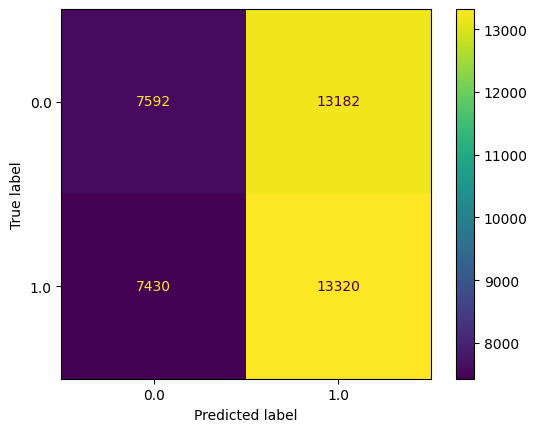

In [ ]:
cm = metrics.confusion_matrix(y_test, y_pred, labels = clf.classes_)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix = cm,display_labels = clf.classes_)
disp.plot()

#### Key findings

1. Accuracy:  0.503612 <br/>
Defines the proportion of predictions that were correctly labelled (There is a wildfire and there isn't a wildfire).
2. Precision: 0.502604<br/>
Defines the proportion of wildfires that were correctly labelled as wildfire.
3. Recall: 0.641928<br/>
Defines the proportion of actual wildfires that model was able to detect.
4. F1 Score: 0.563786<br/>
Defines the proportion of Precision and Recall and is an overall indicator of performance of the model.

#### Conclusion

1. The accuracy is about 50%, which is low, especially for a binary classification task.
2. The precision is about 50%, meaning when the model predicts a wildfire, it's only correct about half the time.
3. The recall is higher at 64%, meaning the model correctly identifies a significant portion of actual wildfires, but still misses a good number of them.
4. The F1 score of 56.4% indicates room for improvement in balancing precision and recall.

## The WildFire Analysis

####**Cause recorded of wild fire recorded:**
Knowing the causes of wildfires can be used to develop targeted preventive measures, the historical-wildfire dataset recorded the causes of each historical wildfire. We conducted simple analysis based the date and cause.

There are two type of causes were recorded, general_cause, true_cause. By applying the queries, we can easily understand the relationship between two types of the cause.

In [ ]:
query1 = """
With ranked_cause as (
select count(*) as fire_count ,rank() OVER ( PARTITION BY general_cause_desc ORDER BY count(*) DESC ) count_rank,true_cause,general_cause_desc from `historical-wildfire`
group by general_cause_desc,true_cause)

select fire_count,
count_rank,
true_cause,
general_cause_desc
from ranked_cause
where count_rank <=5
;"""
general_true_cause = pd.read_sql(query1, con=engine)
general_true_cause

,fire_count,count_rank,true_cause,general_cause_desc
0,271,1,Unsafe Fire,Agriculture Industry
1,124,2,Winter Burning,Agriculture Industry
2,61,3,Mechanical Failure,Agriculture Industry
3,58,4,Friction Spark,Agriculture Industry
4,32,5,Burning Substance,Agriculture Industry
...,...,...,...,...
57,312,4,Abandoned Fire,Resident
58,146,5,Unpredictable Event,Resident
59,65,1,None,Restart
60,53,1,None,Under Investigation


The general_cause and true_cause have a nested relationship. But when we see the 'Lightning' in general_cause, the true_cause of 'Lightning' is all null value. Thus we decided also think of 'Lightning' as ture_cause.

In [ ]:
query1 = """select count(*),general_cause_desc from `historical-wildfire`
group by  general_cause_desc
order by count(*) desc;"""
general_cause = pd.read_sql(query1, con=engine)
general_cause

,count(*),general_cause_desc
0,8734,Lightning
1,5591,Recreation
2,4298,Resident
3,2221,Incendiary
4,1345,Power Line Industry
5,887,Undetermined
6,588,Agriculture Industry
7,466,Forest Industry
8,447,Oil & Gas Industry
9,326,Other Industry


In [ ]:
query1 = """select count(*),true_cause from `historical-wildfire`
where true_cause is not null
group by  true_cause
order by count(*) desc ;"""
main_cause = pd.read_sql(query1, con=engine)
main_cause

,count(*),true_cause
0,5273,Unsafe Fire
1,2084,Abandoned Fire
2,1226,Burning Substance
3,1147,Permit Related
4,615,Line Impact
5,512,Winter Burning
6,423,Arson Suspected
7,402,Mechanical Failure
8,363,Unpredictable Event
9,361,Insufficient Buffer


Based on the results above, we have identified the top five most common true causes of wildfires.Which are 'Lightning','Unsafe Fire','Abandoned Fire','Burning Substance','Permit Related'.

>>[Lightning]: A wildfire ignited by lightning.\
>>[Unsafe Fire]:A wildfire caused by any action or conditions that deemed the burning as unsafe. For example:
>>>• an abandoned or unattended fire,\
>>>• burning without a permit or not following permit conditions,\
>>>• high hazard,\
>>>• insufficient buffer/fireguard between fire and forest fuels, \
>>>• high winds, spotting, extremely dry conditions, \
>>>• insufficient resources on site, and \
>>>• a fire that was started during the fire season and was not extinguished.



In [ ]:
query1 ="""select MONTH(STR_TO_DATE(fire_start_date, '%Y-%m-%d')) as month,fire_spread_rate,
general_cause_desc,true_cause
from `historical-wildfire`
;"""
gt_cause = pd.read_sql(query1, con=engine)
gt_cause

,month,fire_spread_rate,general_cause_desc,true_cause
0,4.0,0.0,Resident,Permit Related
1,4.0,0.0,Incendiary,Arson Suspected
2,4.0,0.0,Incendiary,Arson Suspected
3,4.0,0.0,Incendiary,Arson Suspected
4,4.0,0.1,Other Industry,Permit Related
...,...,...,...,...
25316,4.0,0.5,Resident,Unsafe Fire
25317,5.0,0.0,Power Line Industry,Friction Spark
25318,5.0,1.0,Lightning,None
25319,8.0,0.0,Recreation,Unsafe Fire


In [ ]:
gt_cause.loc[gt_cause['general_cause_desc']=='Lightning','true_cause']='Lightning'

In [ ]:
cause_month=gt_cause[gt_cause['true_cause'].isin(["Unsafe Fire","Unsafe Fire","Abandoned Fire","Burning Substance","Permit Related","Lightning"])].groupby(['month','true_cause']).count().reset_index()
cause_month

,month,true_cause,fire_spread_rate,general_cause_desc
0,1.0,Abandoned Fire,44,44
1,1.0,Burning Substance,12,12
2,1.0,Lightning,4,4
3,1.0,Permit Related,21,21
4,1.0,Unsafe Fire,21,21
5,2.0,Abandoned Fire,40,40
6,2.0,Burning Substance,14,14
7,2.0,Lightning,4,4
8,2.0,Permit Related,21,21
9,2.0,Unsafe Fire,18,18


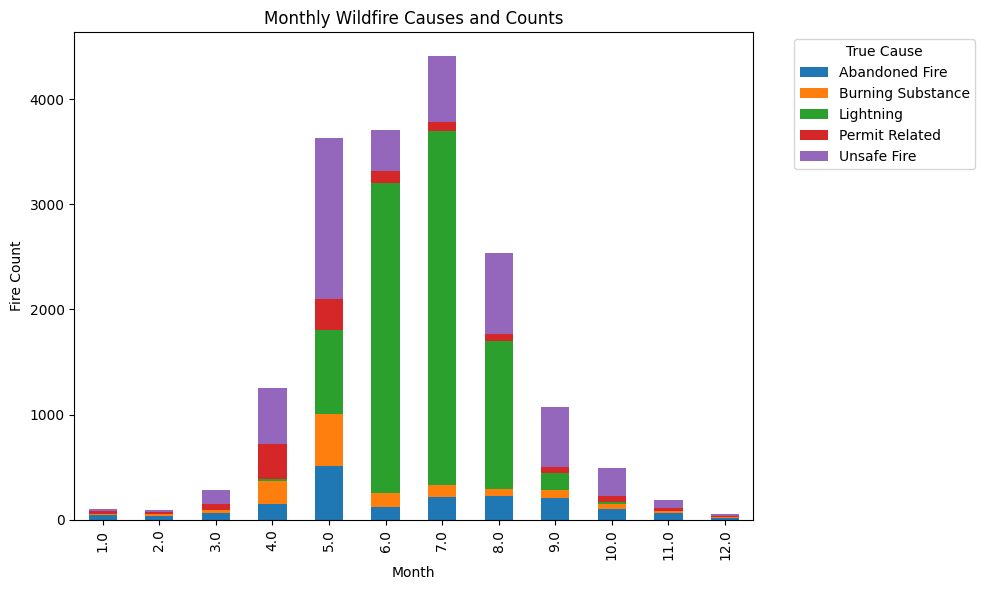

In [ ]:
pivot_df = cause_month.pivot(index="month", columns="true_cause", values="general_cause_desc").fillna(0)
pivot_df.plot(kind="bar", stacked=True, figsize=(10, 6))
plt.title("Monthly Wildfire Causes and Counts")
plt.xlabel("Month")
plt.ylabel("Fire Count")
plt.legend(title="True Cause", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

As the plot shows, summer time is the period that the wildfire happens most frequently. Especailly for Lightning, as the most common cause of wildfire, it barely occurs in months other than summer.

In [ ]:
gt_cause.groupby('true_cause')['fire_spread_rate'].mean().sort_values(ascending=False)

,fire_spread_rate
true_cause,
Lightning,1.388283
Incendiary Device,1.376364
Hot Exhaust,0.941935
Arson Known,0.879661
Arson Suspected,0.873050
Insufficient Buffer,0.853740
Burning Substance,0.846330
Friction Spark,0.682673
Mechanical Failure,0.657214


The Lighining caused fire also has the highest spread rate.

In conclusion, the lightning is the main cause of wildfires and has the highest spread rate, which is very noteworthy.In the future, we can further analyze the location of lightning and environmental factors

## Impact of WildFire Analysis using the National Forest Dataset

Wildfires are a significant environmental concern, it can lead to changes in ecosystems, human health, and atmospheric conditions. To identify the imapct of wildrie we chose the National Forest Dataset and Air Quality Dataset. We chose the National Forest Dataset and the Air Quality Dataset in conducting a comprehensive analysis of the effects of wildfires. The National Forest Dataset provides information on the time-space characteristics of wildfires, such as causes, area burned. Meanwhile, the Air Quality Dataset captures the secondary effects of wildfires, especially on air quality, including changes in particulate matter and pollutant concentrations. Moreover, we will combine the historical wildfire dataset to analyze the reasons behind out findings and assumptions.


Query 1: Factors contributing to Alberta fire initiation
            Cause  Total_Area_Burned
0       Lightning       3.320632e+06
1     Unspecified       1.874084e+06
2  Human activity       7.320835e+05
3          Reburn       2.289600e+02

Query 2: Environmental impacts of wildfires in Alberta
    Year Jurisdiction  Total_Area_Burned
0   1990      Alberta       34084.899109
1   1991      Alberta        6164.800049
2   1992      Alberta        3547.999908
3   1993      Alberta       26060.409204
4   1994      Alberta       29582.229736
5   1995      Alberta      337949.570068
6   1996      Alberta        1961.389999
7   1997      Alberta        4724.949814
8   1998      Alberta      726968.090317
9   1999      Alberta      120504.773232
10  2000      Alberta       14735.900137
11  2001      Alberta      154103.737656
12  2002      Alberta      496419.215000
13  2003      Alberta       74906.921387
14  2004      Alberta      236163.374784
15  2005      Alberta       60726.141096
16  

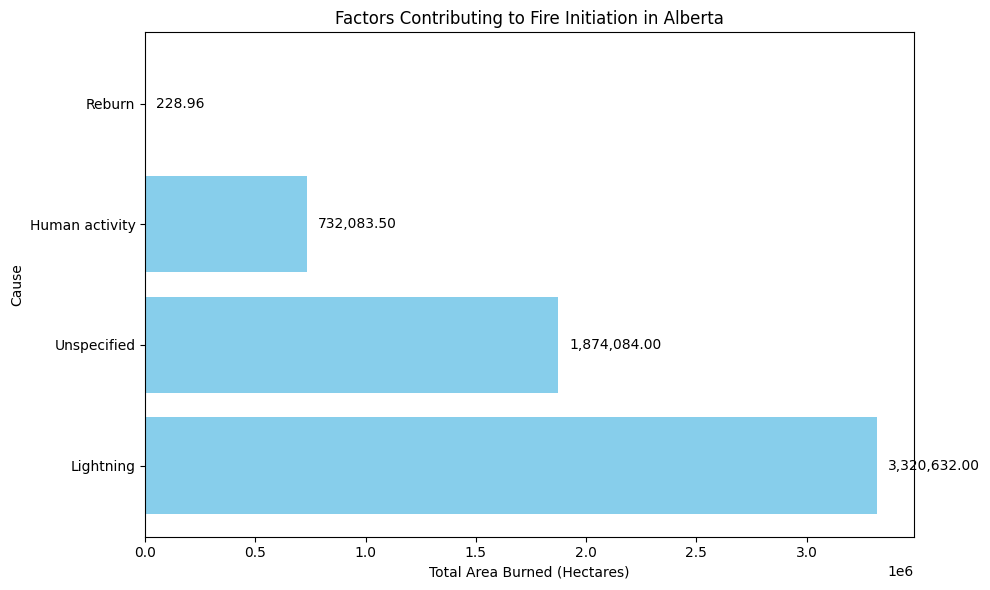

In [ ]:

try:
    # Query 1: Factors contributing to Alberta fire initiation
    query1 = """
    SELECT Cause, SUM(`Area__hectares_`) AS Total_Area_Burned
    FROM burned_by_cause
    where iso = 'AB'
    GROUP BY Cause
    ORDER BY Total_Area_Burned DESC;
    """
    df_query1 = pd.read_sql(query1, con=engine)
    print("\nQuery 1: Factors contributing to Alberta fire initiation")
    print(df_query1)

    # Query 2: Environmental impacts of wildfires in Alberta
    query2 = """
    SELECT ___Year AS Year, Jurisdiction, SUM(`Area__hectares_`) AS Total_Area_Burned
    FROM burned_by_cause
    WHERE Jurisdiction = 'Alberta'
    GROUP BY ___Year, Jurisdiction
    ORDER BY ___Year ASC;
    """
    df_query2 = pd.read_sql(query2, con=engine)
    print("\nQuery 2: Environmental impacts of wildfires in Alberta")
    print(df_query2)

    # Query 3: Temporal patterns in Alberta wildfire occurrence
    query3 = """
    SELECT Month, AVG(`Area__hectares_`) AS Avg_Area_Burned
    FROM burned_by_month
    where iso = 'AB'
    GROUP BY Month
    ORDER BY FIELD(Month, 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December');
    """
    df_query3 = pd.read_sql(query3, con=engine)
    print("\nQuery 3: Temporal patterns in Alberta wildfire occurrence")
    print(df_query3)

    # Query 4: Spatial patterns in wildfire occurrence
    query4 = """
    SELECT Jurisdiction, SUM(`Area__hectares_`) AS Total_Area_Burned
    FROM burned_by_cause
    GROUP BY Jurisdiction
    ORDER BY Total_Area_Burned DESC;
    """
    df_query4 = pd.read_sql(query4, con=engine)
    print("\nQuery 4: Spatial patterns in wildfire occurrence")
    print(df_query4)

    # Query 5: Impact of fire size class in Alberta
    query5 = """
    SELECT `Fire_size_class`, SUM(`Area__hectares_`) AS Total_Area_Burned
    FROM burned_by_size
    where iso = "AB"
    GROUP BY `Fire_size_class`
    ORDER BY Total_Area_Burned DESC;
    """
    df_query5 = pd.read_sql(query5, con=engine)
    print("\nQuery 5: Impact of fire size class in Alberta")
    print(df_query5)

     ## query 6 : total area burned by year in Alberta"
    query6 = """
    select year,sum(Area__hectares_) from project_dataset.burned_by_month
    where iso = 'AB'
    group by year;"""

    df_query6 = pd.read_sql(query6, con=engine)
    print("\nQuery 6: grouped total area burned by year in Alberta")
    print(df_query6)

    ## query 7: number of fire yearly from historical wildfire data
    query7 = """
    SELECT count(*) as fire_count , fire_year
    from project_dataset.`historical-wildfire`
    group by fire_year
    order by fire_year;
    """

    df_query7 = pd.read_sql(query7, con=engine)
    print("\nQuery 7: numbers of fire yearly")
    print(df_query7)






except Exception as e:
    print(f"Error executing queries: {e}")


import matplotlib.pyplot as plt
# Visualize the results for Factors Contributing to Fire Initiation in Alberta

causes = ['Lightning', 'Unspecified', 'Human activity', 'Reburn']
areas_burned = [3320632, 1874084, 732083.5, 228.96]

plt.figure(figsize=(10, 6))
bars = plt.barh(causes, areas_burned, color='skyblue')
for bar, value in zip(bars, areas_burned):
    plt.text(value + 50000, bar.get_y() + bar.get_height()/2, f'{value:,.2f}', va='center', fontsize=10)
plt.xlabel('Total Area Burned (Hectares)')
plt.ylabel('Cause')
plt.title('Factors Contributing to Fire Initiation in Alberta')
plt.tight_layout()

plt.show()




This graph shows the casues of fire contribute to total area bruned from 2006-2020

### **Factors Contributing to Fire Initiation in Alberta**


| Cause              | Total_Area_Burned      |
|--------------------|------------------------|
| Lightning          | 3,320,632 hectares     |
| Unspecified        | 1,874,084 hectares     |
| Human activity     | 732,083.5 hectares     |
| Reburn             | 228.96 hectares        |
|                    | ~5,927,029.15 hectares  |



The result suggests that lightning is the most common natural cause of wildfire ignition **in Alberta**, with an area burned of about **3,320,632 hectares**, presents a share of more than **56%** of the area. This shows that natural causes are still significant and dominant in areas prone to dry weather and thunderstorms. Most of these fires caused by lightning are unpredictable or uncontrollable, particularly in remote areas because of late detection and suppression.It **disproportionately contributes to larger burned areas** compared to other causes.

Surprisingly, the causes of a very large **31.62%** of the total area burned remain unknown, reflecting either potential failures of data collection or its classification methodologies. The unspecified class accounts for **1,874,084** hectares, showing data that were either not collected or not reported. Such unclear categorization makes the effective implementation of resource management and wildfire prevention policies quite impossible; thus, there is a dire need for improved data tracking and classification systems.

**Human causes** account for about **12%** of the total area that has been burnt, which we thought it would be high, but is substantially lower, around  **732,083.5** hectares indicate quite intensive anthropogenic factors: negligence, industrial operations, or changes in land use. Though the number is much smaller compared to the figure due to natural causes, this proves how important public awareness and regulations can be in terms of the risks brought forth by fires caused by human factors.

In contrast, the relatively small area of reburns **228.96** hectares-suggests that fire recur in previously burned areas, constitute a nearly negligible percentage of the total area burned. This could indicate that reburns are rare or they happen in less prone regions, probably because of the lessened availability of combustible material.

On the other hand, it is a big reason why media reports and news on wildfires often point out human activity as a huge factor, simply due to the preventability of them; however, the data suggests natural causes as the leader here. Additionally, while lightning is not as popular in media, its disproportionately high impact needs a change in narrative and resources towards investing in early detection, like adding many more lightning mapping arrays with corresponding rapid response units.

The discrepancy between the reported causes of wildfires and public perceptions underlines the need for nuanced communication strategies. In terms of policy making, these findings can advocate a balanced approach that considers both natural and human-induced causes of wildfires, while simultaneously investing in predictive analytics, monitoring technologies, and sustainable land management practices.

### **Temporal Patterns in Wildfire Occurrence**

| Month            | Avg Area Burned   |
|-------------------|-------------------|
| May              | ~109,081 hectares |
| June             | ~43,903 hectares  |
| July             | ~27,698 hectares  |
| August           | ~14,241 hectares  |
| Other months     | < 2,600 hectares  |


Temporal patterns of wildfire occurrences have high **seasonal variability**; most of the wild fire incidents are concentrated during late spring and summer. **May** comes out as the most important month, with its average area burned the highest, implying that probably in this month, fires are more likely to be triggered by a combination of arid conditions, increased vegetation flammability, and possible sources of ignition such as lightning or human activity. This decrease in the burned area over June, July, and August may reflect either that environmental conditions become less favorable for the propagation of wildfires or that mitigation measures, such as fire suppression, become more effective with time.

This pattern again points to the importance of environmental factors in the dynamics of wildfires. For instance, warmer and drier conditions in late spring and early summer can **increase** fire hazards by reducing vegetation and soil moisture. In contrast, very little activity of wildfires can be seen during winter, such as during December, January, and February, presumably because snow cover, higher moisture, and cooler temperatures impede ignition and **limit** the amount of flammable materials.

This information underlines the importance of focused wildfire prevention strategies in high-risk periods like May. The policies should focus on early detection systems, public awareness, and resource allocation during the crucial months to reduce the impact of wildfires. Furthermore, knowledge of the interaction of climatic conditions and the behavior of wildfires can help in predicting the future seasons of wildfires, which climate change is most likely to worsen in frequency and intensity in many parts of the world.








### **Spatial Patterns in Wildfire Occurrence**
| Jurisdiction            | Total_Area_Burned         |
|-------------------------|---------------------------|
| Northwest Territories   | 18,615,860 hectares      |
| Saskatchewan            | 14,927,940 hectares      |
| Quebec                  | 8,233,936 hectares       |
| Alberta                 | 5,927,029 hectares       |
| Prince Edward Island    | 35 hectares              |

The spatial distribution of wildfire occurrences highlights significant disparities in total area burned across jurisdictions, emphasizing the influence of geographic, ecological, and resource-related factors on wildfire dynamics. The **Northwest Territories** exhibit the largest total burned area, **exceeding 18 million hectares**. This can be attributed to the region’s expansive forested landscapes, which provide abundant fuel for fires, coupled with sparse population density and limited fire suppression resources, making containment more challenging. Similarly, **Saskatchewan and Quebec** also report substantial wildfire activity, each with millions of hectares burned. These provinces' extensive boreal forests and dry climatic conditions, combined with frequent lightning events, create favorable environments for wildfires to ignite and spread.

Interestingly, **Alberta and British Columbia**, despite their susceptibility to wildfires,and we often see news realted to wildfire to this two province,  are not among the top three jurisdictions for total area burned. This could be due to differences in fire management strategies, such as more advanced detection systems, better resource allocation, or more effective fire suppression efforts. Additionally, variations in forest composition and land use practices may contribute to the lower total burned area, as Alberta and BC may have more fragmented landscapes or more stringent regulations on land use near fire-prone areas. These findings highlight the importance of considering regional management practices and ecological factors when analyzing wildfire patterns and developing mitigation strategies.

### **Impact of Fire Size Class in Alberta**
| Fire Size Class      | Total_Area_Burned       |
|----------------------|-------------------------|
| Over 100 000         | 2,979,912 hectares      |
| 10 000 - 100 000 ha  | 1,884,255 hectares      |
| 1,000 - 10,000 ha    | 829,175.5 hectares      |
| 100.1 - 1,000 ha     | 165,345.8 hectares      |
| Up to 0.1 ha         | 858.24 hectares         |

When take a look of the distribution of fire size classes in Alberta, **large fires exceed 10,000 ha account disproportionately for the total area burned.** Fires over **100,000 ha** alone account for nearly **3 million hectares**, while those between **10,000 and 100,000** ha add another **1.88 million hectares**. These large-scale events thus highlight the need for concentrated resources and methods of dealing with and reducing their impact, as they are responsible for the bulk of wildfire damage despite occurring less frequently.

On the other hand, smaller fires, such as those between **100.1 and 1,000 ha**, or those **up to 0.1 ha**, collectively burn significantly less area. For instance, the total for fires **up to 0.1 ha is 858.24 hectares**. These may happen a little more frequently, whereas the rest of the area burned shows up under quite large fires. This large disparity underlines that early detection and rapid response are quite relevant in trying to prevent small fires from developing into large ones. Because this focuses on large wildfires, Alberta can effectively shift its resources towards mitigating those incidents responsible for disproportionate damages.

Based on the findings from the **National forest datas**, there are something that we can join another dataset to dig out the reasons behind the result. So we join the dataset **Area Burned by Cause of Fire with the Historical Wildfire dataset** to find out how much area get burned due to lighthening each fire reported by this cause, and also joined  **Area Burned by month of Fire with the Historical Wildfire dataset** to analzye why there are serval years indicate more areas were burned with the temperature provided on the other dataset. To join the data, we use aggregate function and matching the data with year and month.




The joining process is below:

In [ ]:
try:
  query8 = """
  with hw as (select month(date_format(start_for_fire_date,"%y-%m-%d")) as Month_,
  avg(temperature) as avg_temp, year(date_format(start_for_fire_date,"%y-%m-%d")) as Year_
  from project_dataset.`historical-wildfire` c
  group by Month_,Year_)

  select hw.Month_,avg_temp,d.sum_area,d.Year
  from hw
  join (select
    CASE Month
          WHEN 'January' THEN 1
          WHEN 'February' THEN 2
          WHEN 'March' THEN 3
          WHEN 'April' THEN 4
          WHEN 'May' THEN 5
          WHEN 'June' THEN 6
          WHEN 'July' THEN 7
          WHEN 'August' THEN 8
          WHEN 'September' THEN 9
          WHEN 'October' THEN 10
          WHEN 'November' THEN 11
          WHEN 'December' THEN 12
      END AS Month_, Year, sum(Area__hectares_) as sum_area
  from project_dataset.burned_by_month
  where Month != "Unspecified"
  group by Month_,Year) d

  on hw.Month_=d.Month_
  and hw.Year_=d.Year;

  """

  df_query8 = pd.read_sql(query8, con=engine)
  print("\nQuery 8: join data with monthly ave_temperature and area burned")
  print(df_query8)

  query9 = """
    SELECT ___Year AS Year, Jurisdiction, SUM(`Area__hectares_`) AS Total_Area_Burned
    FROM burned_by_cause
    WHERE Jurisdiction = 'Alberta' and ___Year > 2005
    GROUP BY ___Year, Jurisdiction
    ORDER BY Total_Area_Burned ASC;
    """
  df_query9 = pd.read_sql(query9, con=engine)
  print("\nQuery 9: Environmental impacts of wildfires in Alberta")
  print(df_query9)

except Exception as e:
  print(f"Error executing queries: {e}")


Query 8: join data with monthly ave_temperature and area burned
     Month_  avg_temp       sum_area  Year
0        10    7.3158     620.012989  2006
1        11   -3.1667    2731.759001  2006
2        12   -3.0000       6.810000  2006
3         4   14.5657   97023.813236  2006
4         5   17.7907   37302.021928  2006
..      ...       ...            ...   ...
156       6   19.3889  401044.496093  2019
157       7   22.9883  315438.792835  2019
158       8   16.7143    8655.303969  2019
159       9   13.3333     271.134094  2019
160       3   -7.5000      87.556000  2020

[161 rows x 4 columns]

Query 9: Environmental impacts of wildfires in Alberta
    Year Jurisdiction  Total_Area_Burned
0   2020      Alberta        3275.000000
1   2013      Alberta       19578.840622
2   2008      Alberta       20788.829462
3   2014      Alberta       23692.710089
4   2017      Alberta       49233.310722
5   2018      Alberta       60185.218628
6   2009      Alberta       66902.840073
7   2010   

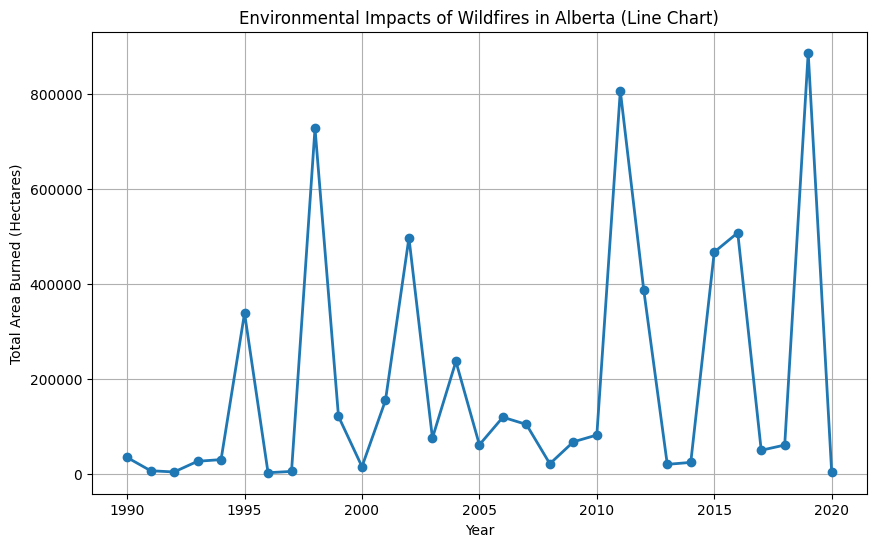

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df_query2['Year'], df_query2['Total_Area_Burned'], marker='o', linestyle='-', linewidth=2)
plt.xlabel('Year')
plt.ylabel('Total Area Burned (Hectares)')
plt.title('Environmental Impacts of Wildfires in Alberta (Line Chart)')
plt.grid(True)
plt.show()

As we mentioned above, there are high burn years such as 1998, 2011, and 2019, with over 700,000 hectares burned for each year compared to low burn years 1992, 1996, and 2020 with less then 5000 hectares burned. We assume this result might related to the climate throught out those years. Therefore, we join this dataset with the historical wildfire dataset which include temperature data from 1998-2023 to evaluate whether this could be the potential reaosn contribute to the high burn years and low burn years. We named the joined table as "temperature and total area burned". After that we create a line graph for both the temeprature and the hectares burned to see if there is a relationship between them.  However, the data from Historical Wildfire dataset starts from Year 2006, so the final data we joined is from 2006-2020 based on that. Therefore, the analysis of the temperature and wildfire area burn will focus on the year after 2006 till 2020.


In [ ]:
try:
    query_1 = """select * from temperature_and_total_burned
    where Year IN ( 2013, 2008, 2014)
    order by year, month_;"""
    result1 = pd.read_sql(query_1, con=engine)
    print("\n low burn year data :")
    print(result1)

    query_2 = """select * from temperature_and_total_burned
    where Year IN (2019, 2016, 2011)
    order by year, month_;"""
    result2 = pd.read_sql(query_2, con=engine)
    print("\n high burn year data :")
    print(result2)

except Exception as e:
    print(f"Error executing query: {e}")




 low burn year data :
    Month_  avg_temp      sum_area  Year
0        1   -3.0000  5.943000e+01  2008
1        2    4.0000  2.202000e+01  2008
2        3    3.8235  1.819850e+03  2008
3        4    6.7353  4.743054e+03  2008
4        5   17.4668  9.204529e+04  2008
5        6   19.9379  9.260325e+05  2008
6        7   21.2778  5.172785e+05  2008
7        8   22.2534  1.009643e+05  2008
8        9   13.4595  5.713160e+02  2008
9       10    6.9195  9.553580e+02  2008
10      11    4.5000  1.490770e+02  2008
11      12  -21.0000  4.658290e+02  2008
12       1   -5.0000  1.480000e+01  2013
13       2   -1.0000  6.770000e+00  2013
14       3   -1.6250  5.355500e+01  2013
15       4    8.6875  8.013254e+03  2013
16       5   19.4383  3.772833e+04  2013
17       6   21.2088  3.022155e+06  2013
18       7   22.4859  1.023107e+06  2013
19       8   20.8980  1.406622e+05  2013
20       9   18.3043  6.017864e+03  2013
21      10    6.8750  5.923810e+02  2013
22      11   -1.0000  1.770000e+00

We have a new table "temperature and total area burned", now we will create a line graph to see the realationship between the temperature and the total area burned. And based on the 2006-2019 data. However,there are some monthly data missing from the burned_by_month dataset, so we will focus more on date from 2006-2019 for more accurate analysis.

### **Environmental Impacts of Wildfires in Alberta from 2006-2020**
| Year  | Jurisdiction | Total_Area_Burned       |
|-------|--------------|-------------------------|
| 2019  | Alberta      | 885,943 hectares        |
| 2011  | Alberta      | 805,888 hectares        |
| 2016  | Alberta      | 507,057 hectares        |
| 2014  | Alberta      | 23,692 hectares          |
| 2008  | Alberta      | 20,788 hectares          |
| 2013  | Alberta      | 19,578 hectares          |


From the provided data, the following years are considered high-burn years:
**2011: 805,888 hectares burned**, **2016: 507,057 hectares burned** and **2019: 885,943 hectares burned**. And low burn year **2014: 23,692 hectares burned**, **2013: 19,578 hectares burned** and **2008: 20,788 hectares burned**

Then we plot the graphs of the temperature and the total area burned for those specific years and analzye the pattern.


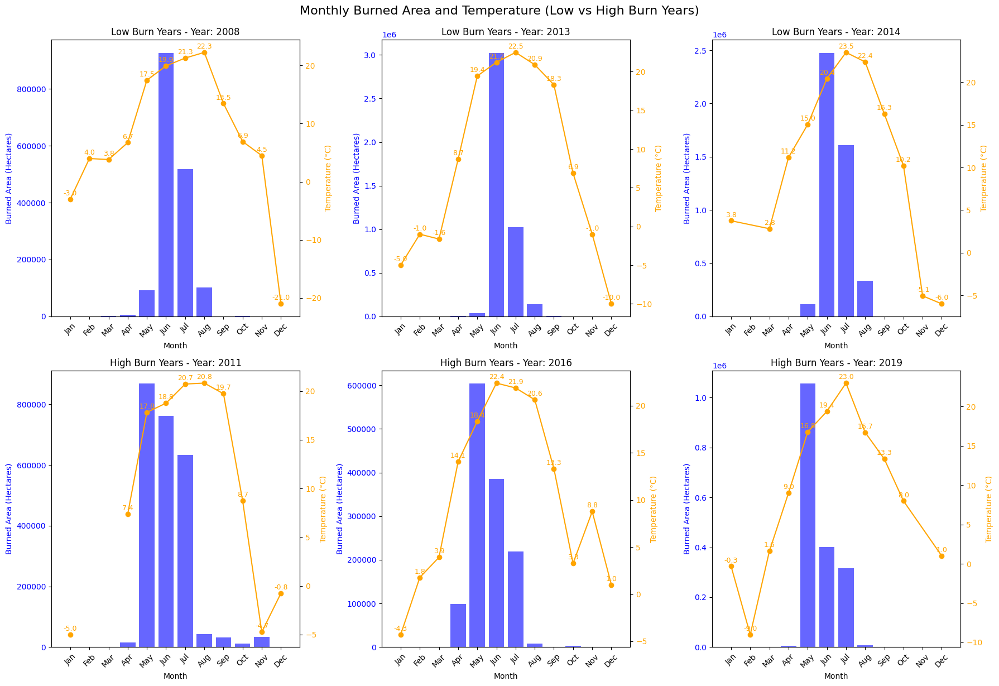

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Combine years and datasets
data = {
    "Low Burn Years": result1,
    "High Burn Years": result2
}

# Create a 2x3 grid layout
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Loop over datasets and years
index = 0
for category, df in data.items():
    years = df['Year'].unique()
    for year in years:
        ax1 = axes[index]
        year_data = df[df['Year'] == year]

        # Bar chart for burned area
        ax1.bar(year_data['Month_'], year_data['sum_area'], color='blue', alpha=0.6)
        ax1.set_xlabel('Month')
        ax1.set_ylabel('Burned Area (Hectares)', color='blue')
        ax1.set_xticks(range(1, 13))
        ax1.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
        ax1.tick_params(axis='y', labelcolor='blue')

        # Line chart for temperature
        ax2 = ax1.twinx()
        ax2.plot(year_data['Month_'], year_data['avg_temp'], marker='o', color='orange')
        ax2.set_ylabel('Temperature (°C)', color='orange')
        ax2.tick_params(axis='y', labelcolor='orange')

        # Title and annotations
        ax1.set_title(f'{category} - Year: {year}')
        for x, y in zip(year_data['Month_'], year_data['avg_temp']):
            ax2.annotate(f'{y:.1f}', (x, y), textcoords="offset points", xytext=(0, 5), ha='center', fontsize=9, color='orange')

        index += 1

# Adjust layout
fig.tight_layout()
plt.suptitle('Monthly Burned Area and Temperature (Low vs High Burn Years)', fontsize=16, y=1.02)
plt.show()


## By comparing the data for high burn years and low burn years we discover some key observations:

####**Seasonal Patterns of Wildfire Activity:**
Across all six years, most burned areas were concentrated in late spring and summer (May, June, and July) which is considered as **High Wildfire Activity Month**. These three months had higher average temperatures, mostly above 20°C, which could explain increased susceptibility to wildfire.
For instance, in 2019, the peak of burned area corresponds to June (23.0°C), which indicates a high correlation between high temperatures and the propagation of wildfires.

Winter months, from December to February, consistently depict the least burned areas for all years. This would be expected because of the cold temperatures, usually below freezing, reduced vegetation flammability, and also snow cover.

This also correspond to the finding that we have for **Temporal Patterns in Wildfire Occurrence**

####**Interannual Variability in Burned Area**
In high burn years, such as 2011 and 2016, large areas were affected, notably in peak summer months, such as June. Those years probably had extreme conditions, including sustained heatwaves and extended dry periods with strong winds, coming together to worsen the spread and intensity of wildfires. For instance, in 2016, almost 2 million hectares were burned in June at an average temperature of 21.9°C. This correlation illustrates how high temperatures and dry ecological conditions, such as arid vegetation, contribute to increased vulnerability to wildfires. On the other hand, low burn years like 2008 reflect a dramatic decrease in the number of wildfires, even during those months that are usually very prone to wildfire activity. In June 2008, for example, only about 100,000 hectares were burned. These reductions may be due to lower temperatures, increased rainfall, or perhaps the efficiency of proactive fire management strategies that involve early detection systems and resource allocation. The contrast is a reminder of how important the interplay of climatic factors and intervention measures is in shaping wildfire outcomes.

####**Temperature-Burned Area Correlation**

While temperature is a key driver of wildfire activity, the relationship between temperature and burned area is not always linear. For example, in 2013, June had a high temperature of 22.5°C, and the burned area reached to almost 3 million hectares. That could indicate other factors, such as increased human activities, lightning strikes, or exceptionally dry conditions, might have enhanced the severity of the wildfires. Conversely, the similarly high June temperatures (~23.5°C) in 2014 coincided with a relatively lower burned area of ~1.5 million hectares, which could be indicative of effective fire suppression, change in vegetation or fuel condition, or wetter conditions promoting less fire spread. This thus underlines the complexity in the dynamics of wildfires and the need to consider environmental and anthropogenic factors beyond temperature.

####**Influence of Other Environmental Factors**
In 2019, the total burned area was highest in June-23.0°C, having considerably decreased afterwards, although temperature highs persisted in July-August. It proves once again that temperature factors can't be regarded as single controlling factors in shaping the wildfire course because some other factors such as rain, wind, or simply effective firefighting actions come to great importance. Further, notably low burned areas, even during the peak summer months of the year 2008, have been observed. This may be explained by favorable climatic factors that included a relatively higher rate of humidity or timely rains. These likely reduced the risks of ignition and spread of fires.

####**Importance of Fire Management**
Years with minimal areas that were burnt, such as in 2008 and 2014, reflect probably the effectiveness of fire mitigation efforts through controlled burns, advanced fire detection technologies, and enhanced public awareness campaigns. Such proactive steps probably helped in containing fire risks coupled with favorable environmental conditions. On the other hand, years with huge areas burned represent the vulnerability of the ecosystems under extraordinary weather conditions and show the urgent need for adaptation and robustness in fire management systems. This is particularly important, as climate variability increases gradually and goes on raising risks of wildfires.












Therefore, there is a very complex relationship between temperature and wildfire activities, showing great year-to-year and month-to-month variations. While higher temperatures during the summer period generally relate to a high level of wildfire activities, precipitation, wind conditions, and human activities create large variability in fire outcomes. Active fire management policies, considering climatic and fire regime conditions, become an important strategy to reduce risk and protect ecosystem and communities, especially within a changing climate.

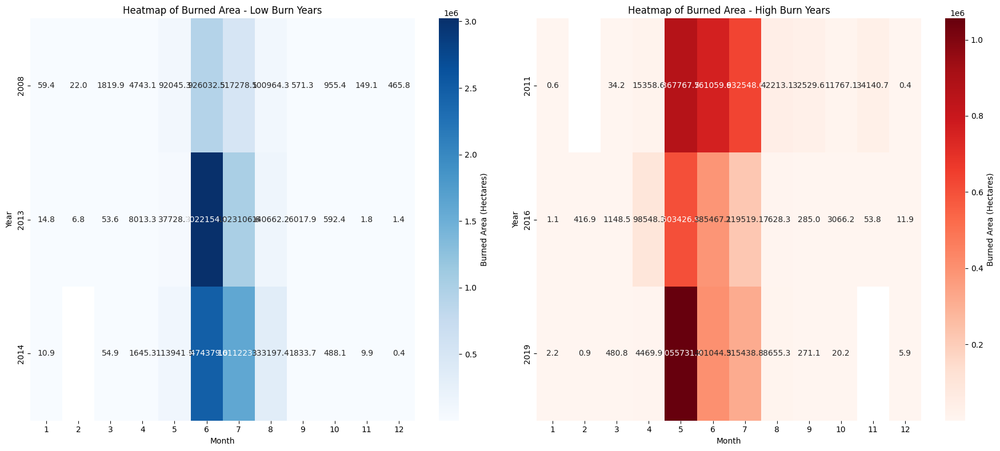

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming `result1` and `result2` contain data for low burn and high burn years

# Create pivot tables for each dataset
low_burn_pivot = result1.pivot(index='Year', columns='Month_', values='sum_area')
high_burn_pivot = result2.pivot(index='Year', columns='Month_', values='sum_area')

# Set up the figure and axes for the heatmaps
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Heatmap for low burn years
sns.heatmap(
    low_burn_pivot, cmap="Blues", annot=True, fmt=".1f",
    ax=axes[0], cbar_kws={'label': 'Burned Area (Hectares)'}
)
axes[0].set_title('Heatmap of Burned Area - Low Burn Years')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Year')

# Heatmap for high burn years
sns.heatmap(
    high_burn_pivot, cmap="Reds", annot=True, fmt=".1f",
    ax=axes[1], cbar_kws={'label': 'Burned Area (Hectares)'}
)
axes[1].set_title('Heatmap of Burned Area - High Burn Years')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Year')

# Adjust layout
plt.tight_layout()
plt.show()


Additonally, I create a heatmap for a another type of visualization. The heatmaps clearly show that burned areas have a seasonal pattern, peaking during June and July, coinciding with the typical wildfire seasons. High burn years are characterized by significantly larger burned areas and extended fire activity into the surrounding months, which indicates exacerbating factors such as drought or extreme weather. On the other hand, low burn years are characterized by more localized and smaller-scale fire activities that could be indicative of the influence of milder weather or effective management. This points to the great need for proactive fire mitigation, especially in the high burn years during the peak months of risk. Understanding the factors that minimize fire activity in low-burn years may provide critical strategies for reducing impacts from wildfire during periods of high risk. This heatmaps result algin with the previos analysis that the necessacry need to take predictive measures and targeted interventions toward seasonal and annual variations.

After analyzing the temeprature and the wildfire, we shift our attention to the cause of wildfire and also see if it was becasuse of lighthening trigger more fire therefore more area being burned.We join the dataset use the following code:


Query 9: joined data average area burned per fire yearly
    fire_count  fire_year  total_area_burned  ave_burn_per_fire
0         1954       2006      118801.747287          60.799257
1         1348       2007      103618.999051          76.868694
2         1712       2008       20788.830032          12.143008
3         1710       2009       66902.838205          39.124467
4         1840       2010       81323.038899          44.197304
5         1218       2011      805888.163752         661.648739
6         1568       2012      385818.414846         246.057663
7         1226       2013       19578.840070          15.969690
8         1470       2014       23692.710828          16.117490
9         1898       2015      466317.294597         245.688775
10        1376       2016      507057.032355         368.500750
11        1244       2017       49233.309211          39.576615
12        1279       2018       60185.220788          47.056467
13        1005       2019      885943.217557  

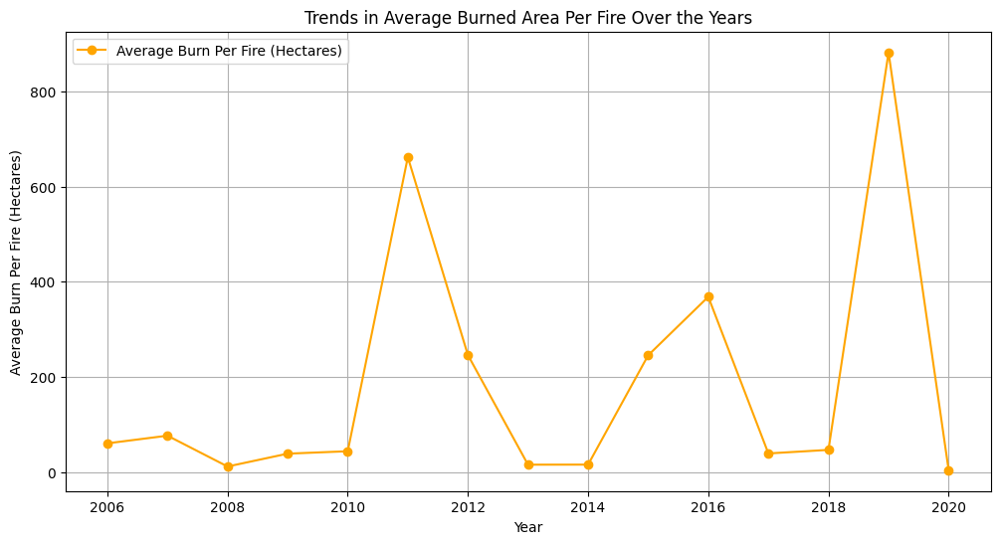

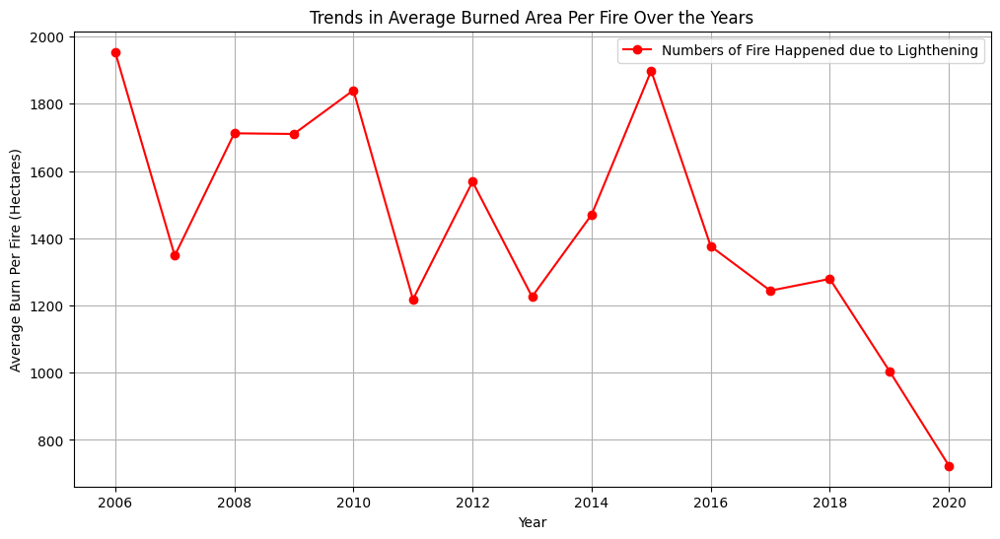

In [ ]:


try:

    ## query 9: join data and create a new table
        query9 = """
        SELECT count(*) as fire_count, a.fire_year, b.total_area_burned, b.total_area_burned/count(*) as ave_burn_per_fire
        from project_dataset.`historical-wildfire` a

        join (
        select year,sum(Area__hectares_) as total_area_burned from project_dataset.burned_by_month
        where iso = 'AB'
        group by year) b

        on b.year = a.fire_year
        group by a.fire_year
        order by a.fire_year;

        """

        df_query9 = pd.read_sql(query9, con=engine)
        print("\nQuery 9: joined data average area burned per fire yearly")
        print(df_query9)

except Exception as e:
        print(f"Error executing queries: {e}")

import matplotlib.pyplot as plt

# Plotting the average burned area per fire over the years
plt.figure(figsize=(12, 6))
plt.plot(df_query9['fire_year'], df_query9['ave_burn_per_fire'], marker='o', color='orange', label='Average Burn Per Fire (Hectares)')
plt.xlabel('Year')
plt.ylabel('Average Burn Per Fire (Hectares)')
plt.title('Trends in Average Burned Area Per Fire Over the Years')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(df_query9['fire_year'], df_query9['fire_count'], marker='o', color='red', label='Numbers of Fire Happened due to Lighthening')
plt.xlabel('Year')
plt.ylabel('Average Burn Per Fire (Hectares)')
plt.title('Trends in Average Burned Area Per Fire Over the Years')
plt.legend()
plt.grid()
plt.show()




##**Average Burned Area Per Fire**

This plot shows the trends in the average area burned per fire in hectares over the years.


There are significant peaks in 2011 and 2019, where the average burned area per fire exceeds 600 and 800 hectares.  These years likely experienced extreme fire events for large wildfires, such as heatwaves, dry spells, or low humidity. Which we analyze preivsouly and indeed the temperatrue does contribute to more area being burned from the wildfire.

In contrast, years like 2008, 2013, and 2020 show much lower average burned areas per fire, suggesting effective fire suppression efforts, favorable weather conditions, or smaller-scale fires.

The spike in 2011 followed by a decrease in subsequent years suggests an anomaly in fire behavior, possibly driven by unique climatic or ecological factors.

This plot highlights multiple factors, such as weather patterns, vegetation conditions, and fire management strategies could impact to the expand of the widlfire.

Years with significant peaks demand further analysis to understand the underlying causes and improve preparedness for future events.


## **Number of Fires Caused by Lightning**

This plot tracks the number of fires attributed to lightning over the years. The number of lightning-induced fires shows a clear declining trend from 2006 to 2020. Early years, such as 2006 and 2007, see fire counts nearing 1900, whereas by 2020, the count drops below 800.
This decrease could be due to improved early detection systems, better fire management with the development of the technologies, or changes in lightning activity due to shifting climate patterns.

In certain years, like 2012 and 2015, show relative stability in lightning-induced fire counts, suggesting that lightning activity or environmental conditions remained consistent during these periods.

The decline in lightning-induced fires could indicate progress in fire mitigation measures, such as controlled burns or increased public awareness.
It could also reflect shifts in weather patterns, with fewer lightning storms capable of igniting wildfires.


Despite the declining trend in lightning-induced fires,  in some particular years, for instance 2011 and 2019, the average area that has been burning per single fire increases dramatically. That might indicate that with the decline in the number of fires induced by lightning, their size and intensity could be increasing.
This would indicate that the efforts to reduce the frequency of fires are really effective, but other factors such as climate change and accumulation of vegetation might be increasing the severity of the remaining ones.


The declining trend in lightning-induced fires implies advancements in fire detection and prevention. However, the increases in the number of burns per fire make it imperative to focus on not only fire count reduction but also on fire intensity mitigation.

Thus, future strategies should prioritize understanding the conditions that lead to large-scale fires during years like 2011 and 2019. This includes analyzing weather data, fuel accumulation, and fire response times.
Efforts to reduce lightning-induced fires should keep on going, but additional measures are required to address the rising intensity of wildfires.

## **Conclusion**
These two plots underline a complex relation between fire frequency and intensity. Even though the number of fires ignited by lightning is going down, while the average area burned per fire shows spikes. This means that the adaptive approach to fire management will need to take into consideration not only frequency but also severity. Understanding what drives these patterns is vital to effective wildfire prevention and mitigation planning.



###Exploration of AQHI dataset.

In [ ]:
import pandas as pd

df = pd.read_csv("cleaned_AQHI_data.csv")
print(df.info())

df['ReadingDate'] = pd.to_datetime(df['ReadingDate'], errors='coerce', utc = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 353831 entries, 0 to 353830
Data columns (total 10 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   CommunityKey      353831 non-null  int64  
 1   ZoneKey           353831 non-null  int64  
 2   Value             353831 non-null  float64
 3   CommunityName     353831 non-null  object 
 4   ReadingDate       353831 non-null  object 
 5   AqhiStatus        353831 non-null  int64  
 6   HealthRisk        353831 non-null  object 
 7   IsPilotCommunity  353831 non-null  bool   
 8   Date              353831 non-null  object 
 9   Time              353831 non-null  object 
dtypes: bool(1), float64(1), int64(3), object(5)
memory usage: 24.6+ MB
None


In [ ]:
invalid_rows = df[df['ReadingDate'].isna()]
print(f"Rows with invalid 'ReadingDate': \n{invalid_rows}")

Rows with invalid 'ReadingDate': 
Empty DataFrame
Columns: [CommunityKey, ZoneKey, Value, CommunityName, ReadingDate, AqhiStatus, HealthRisk, IsPilotCommunity, Date, Time]
Index: []


In [ ]:
df['ReadingDate'] = df['ReadingDate'].dt.tz_convert(None)

In [ ]:
df["HealthRisk"].unique()

array(['Low', 'Moderate', 'High', 'Very High'], dtype=object)

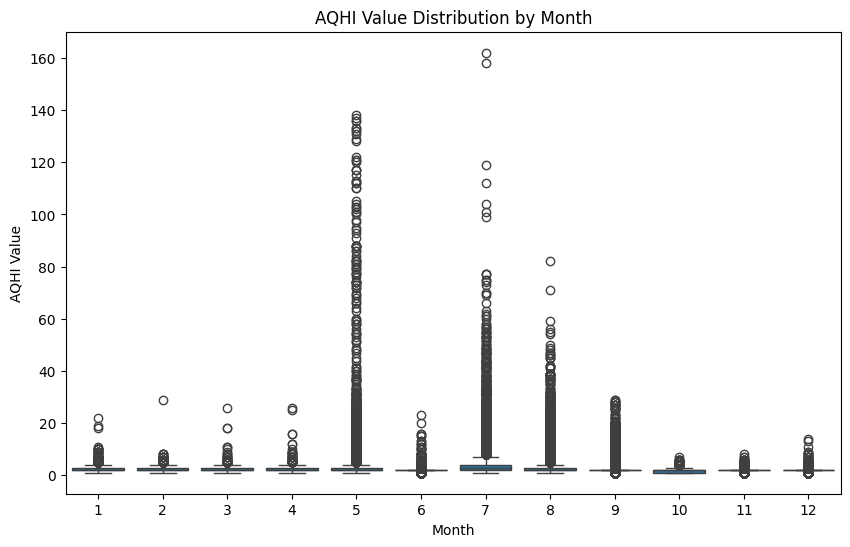

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

df['Month'] = df['ReadingDate'].dt.month

# Plotting AQHI values by month (seasonal analysis)
plt.figure(figsize=(10, 6))
sns.boxplot(x='Month', y='Value', data=df)
plt.title('AQHI Value Distribution by Month')
plt.xlabel('Month')
plt.ylabel('AQHI Value')
plt.show()

#### Key observations from the above graph:

- Higher AQHI values are concentrated in the warmer months (May to August)
- Month 5 and 7 show a higher number of extreme AQHI values, this indicates that these months likely experience higher air pollyution events like wildfires.

overall, this plot suggests a seasonal pattern, where air quality worsens during late spring and summer likely due to environmental factors like wildfires, higher temperatures, or urban pollution.The rest of the year seems to experience better air quality, with fewer instances of extreme AQHI values.

In [ ]:
table_name = "aqhi_by_community"
df.to_sql(table_name, con=engine, if_exists='append', index=False, chunksize=1000)

353831

In [ ]:
pd.read_sql_query("SELECT * FROM aqhi_by_community LIMIT 5;", engine)

,CommunityKey,ZoneKey,Value,CommunityName,ReadingDate,AqhiStatus,HealthRisk,IsPilotCommunity,Date,Time,Month
0,98,34,2.0,Airdrie,2023-11-01 07:00:00,2.0,Low,0,2023-11-01,07:00:00,11.0
1,98,34,2.0,Airdrie,2023-11-01 08:00:00,2.0,Low,0,2023-11-01,08:00:00,11.0
2,98,34,2.0,Airdrie,2023-11-01 09:00:00,2.0,Low,0,2023-11-01,09:00:00,11.0
3,98,34,2.0,Airdrie,2023-11-01 10:00:00,2.0,Low,0,2023-11-01,10:00:00,11.0
4,98,34,2.0,Airdrie,2023-11-01 11:00:00,2.0,Low,0,2023-11-01,11:00:00,11.0


In [ ]:
try:

    query = """
    SELECT CommunityName AS community,
           CASE
               WHEN MONTH(ReadingDate) IN (12, 1, 2) THEN 'Winter'
               WHEN MONTH(ReadingDate) IN (3, 4, 5) THEN 'Spring'
               WHEN MONTH(ReadingDate) IN (6, 7, 8) THEN 'Summer'
               WHEN MONTH(ReadingDate) IN (9, 10, 11) THEN 'Fall'
           END AS season,
           AVG(Value) AS avg_aqhi_value
    FROM aqhi_by_community
    GROUP BY CommunityName, season;
    """

    df_query_1 = pd.read_sql_query(query, engine)
    print(df_query_1.head())

except Exception as e:
    print(f"Error executing queries: {e}")


  community  season  avg_aqhi_value
0   Airdrie    Fall        2.119417
1   Airdrie  Winter        2.484805
2   Airdrie  Spring        2.512737
3   Airdrie  Summer        2.647739
4     Anzac    Fall        2.065527


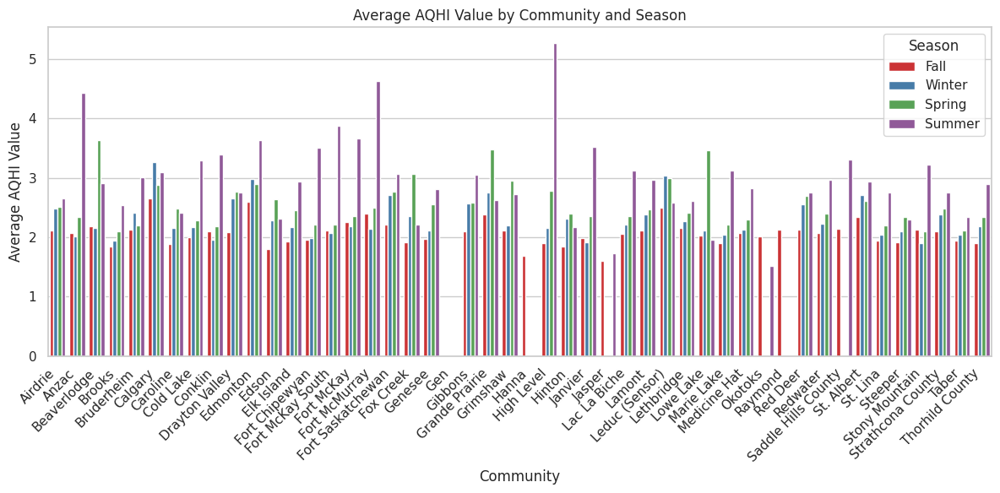

In [ ]:
sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.barplot(data=df_query_1, x='community', y='avg_aqhi_value', hue='season', palette='Set1')

plt.title('Average AQHI Value by Community and Season')
plt.xlabel('Community')
plt.ylabel('Average AQHI Value')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Season', loc='upper right')

plt.tight_layout()
plt.show()

The query aggregates the Air Quality Health Index (AQHI) data by community and season.

We define the seasons based on the months of the year:
- Winter: December, January, and February
- Spring: March, April, and May
- Summer: June, July, and August
- Fall: September, October, and November

For each community, the average AQHI value is calculated across the specified months, which helps identify seasonal trends in air quality for each community.


As expected, the Avg AQHI values are high during the summer across most of the communities. this graph is inline with the box plot above. reinforcing the observation that air quality tends to worsen during summer, likely due to factors like higher temperatures and wildfire activity.

In [ ]:
try:
    query = """
    SELECT CommunityName AS community,
           MAX(Value) AS max_aqhi_value,
           ReadingDate AS date_of_max_aqhi
    FROM aqhi_by_community
    GROUP BY CommunityName, ReadingDate
    ORDER BY max_aqhi_value DESC
    LIMIT 1000;
    """

    df_query_2 = pd.read_sql_query(query, engine)
    print(df_query_2.head())

except Exception as e:
    print(f"Error executing queries: {e}")


    community  max_aqhi_value    date_of_max_aqhi
0  Marie Lake           162.0 2024-07-19 19:00:00
1  Marie Lake           158.0 2024-07-19 18:00:00
2   Lowe Lake           138.0 2024-05-11 13:00:00
3   Lowe Lake           137.0 2024-05-11 12:00:00
4   Lowe Lake           136.0 2024-05-11 14:00:00


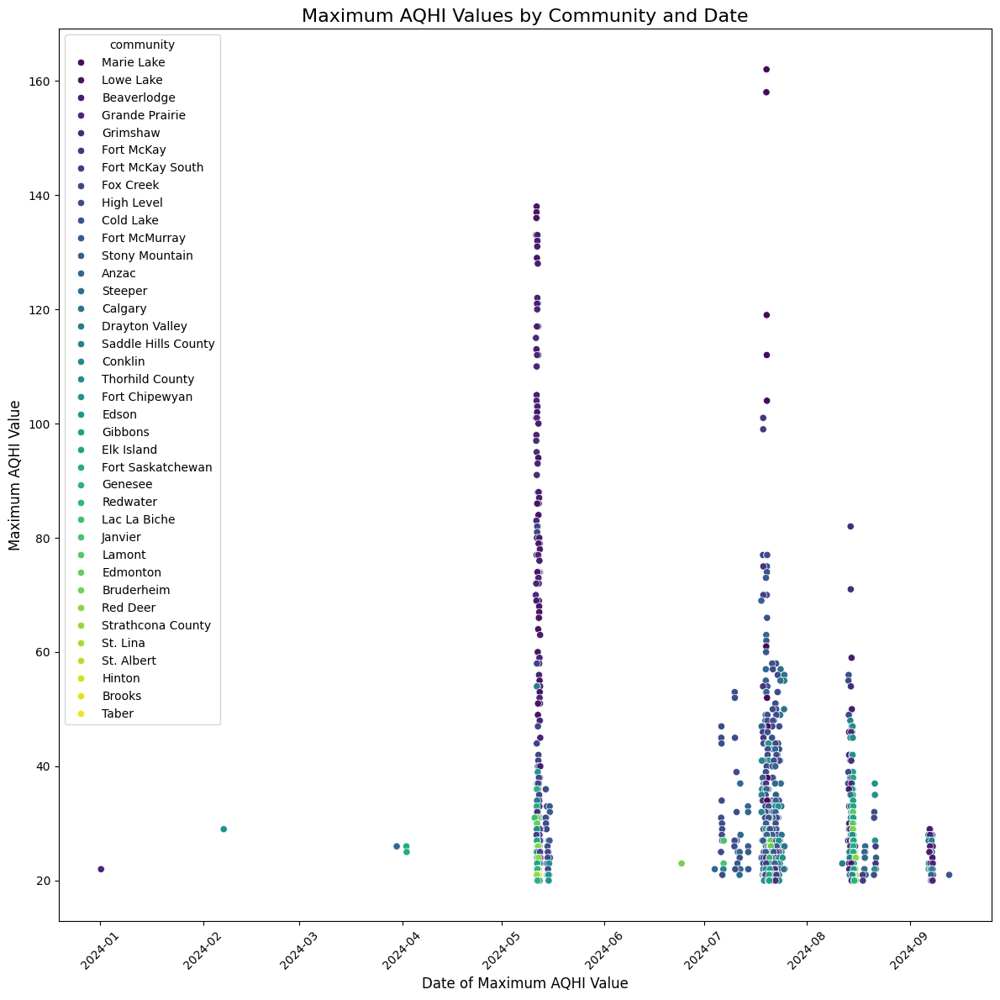

In [ ]:

plt.figure(figsize=(12, 12))
sns.scatterplot(x='date_of_max_aqhi', y='max_aqhi_value', data=df_query_2, hue='community', palette='viridis')

plt.title('Maximum AQHI Values by Community and Date', fontsize=16)
plt.xlabel('Date of Maximum AQHI Value', fontsize=12)
plt.ylabel('Maximum AQHI Value', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


The query retrieves the maximum AQHI values for each community, along with the date when those values were recorded.

As shown in the scatter plot, the highest AQHI values are consistently observed during the months of May, July, and August, regardless of the community. These months coincide with the warmer period of the year, supporting our hypothesis that AQHI tends to worsen during hotter months, likely due to factors such as increased temperatures and potential wildfire activity. This further validates our assumption that seasonal changes play a significant role in air quality variations.

In [ ]:
try:
    query = """
    SELECT CommunityName AS community,
           HealthRisk AS aqhi_status,
           COUNT(*) AS count
    FROM aqhi_by_community
    GROUP BY CommunityName, HealthRisk
    ORDER BY count DESC;
    """

    df_query_3 = pd.read_sql_query(query, engine)
    print(df_query_3.head())

except Exception as e:
    print(f"Error executing query: {e}")


     community aqhi_status  count
0        Edson         Low  16658
1     Caroline         Low  16630
2    Fox Creek         Low  16280
3  Beaverlodge         Low  16238
4       Brooks         Low  16178


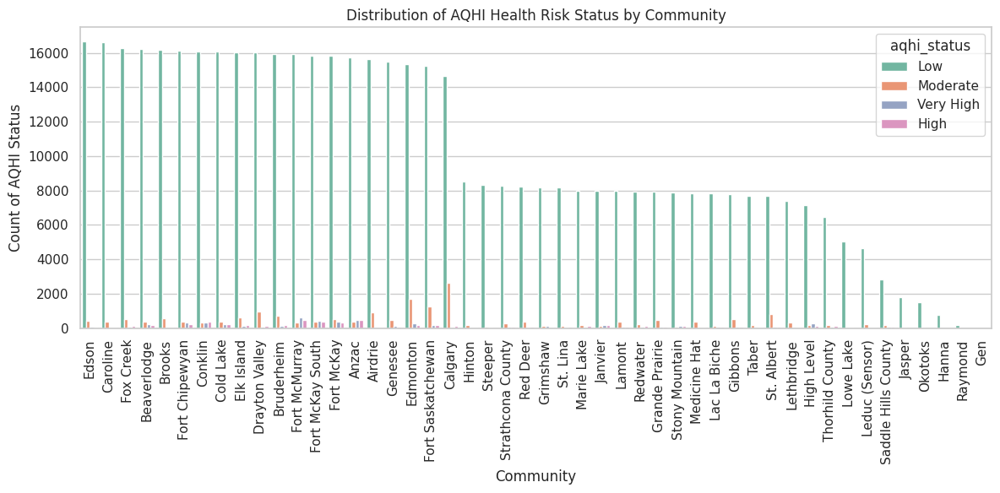

In [ ]:

plt.figure(figsize=(12, 6))
sns.barplot(x='community', y='count', hue='aqhi_status', data=df_query_3, palette='Set2')

plt.title('Distribution of AQHI Health Risk Status by Community')
plt.xlabel('Community')
plt.ylabel('Count of AQHI Status')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


The query calculates the number of occurrences of each HealthRisk status (which corresponds to the AQHI risk levels like Low, Moderate, High, etc.) for every community.


From the visualization, we can observe that most communities have a higher count of the "Low" health risk value, which is a positive indication of good air quality in those areas.

While the majority of the communities show a high count of "Low" health risk values, Jasper, Okotoks, and Hanna stand out with very low counts of "Low" values. This could indicate that these communities face temporary spikes in AQHI values due to localized factors such as industrial activity, seasonal air pollution, or proximity to areas affected by wildfires.

In [ ]:
try:
    query = """
    SELECT CommunityName AS community,
           HealthRisk,
           COUNT(DISTINCT DATE(ReadingDate)) AS high_risk_days
    FROM aqhi_by_community
    WHERE HealthRisk IN ('High', 'Very High')
    GROUP BY CommunityName, HealthRisk
    ORDER BY high_risk_days DESC;
    """

    df_query_4 = pd.read_sql_query(query, engine)
    print(df_query_4.head())

except Exception as e:
    print(f"Error executing query: {e}")


          community HealthRisk  high_risk_days
0     Fort McMurray       High              41
1  Fort McKay South       High              39
2             Anzac       High              38
3        High Level       High              36
4        Fort McKay       High              34


<Figure size 1200x1200 with 0 Axes>

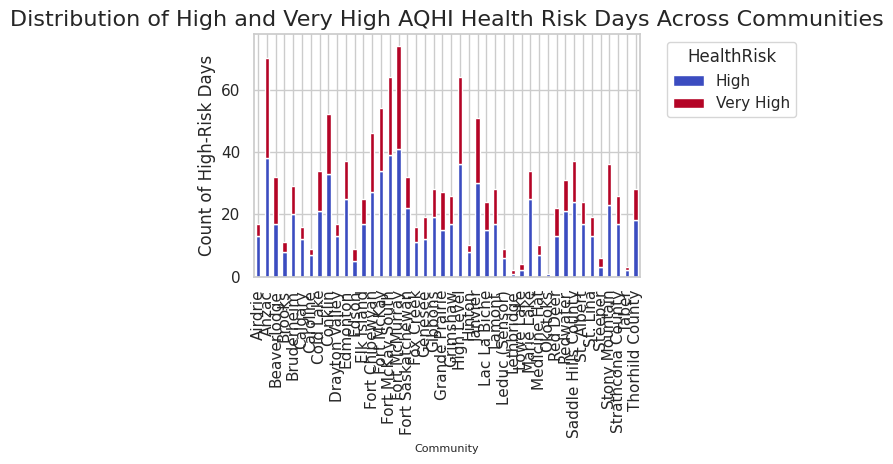

In [ ]:
df_pivot = df_query_4.pivot(index='community', columns='HealthRisk', values='high_risk_days')

plt.figure(figsize=(12, 12))
df_pivot.plot(kind='bar', stacked=True, colormap='coolwarm')

plt.title('Distribution of High and Very High AQHI Health Risk Days Across Communities', fontsize=16)
plt.xlabel('Community', fontsize=8)
plt.ylabel('Count of High-Risk Days', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='HealthRisk', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

This query calculates the number of distinct days each community experienced high or very high AQHI health risks. The results are aggregated by community and health risk status, with a focus on identifying how many days these higher risk levels occurred.

The stacked bar chart clearly illustrates the distribution of "High" and "Very High" AQHI health risk days across the different communities. From the chart, it is evident that most communities experience more "Very High" AQHI days compared to "High" days.


In [ ]:
try:
    query = """
    SELECT CommunityName,
           AVG(Value) AS avg_aqhi_value,
           MIN(Value) AS min_aqhi_value,
           MAX(Value) AS max_aqhi_value
    FROM aqhi_by_community
    GROUP BY CommunityName
    ORDER BY avg_aqhi_value DESC;
    """
    df_query_5 = pd.read_sql_query(query, engine)
    print(df_query_5.head())
except Exception as e:
    print(f"Error executing query: {e}")


    CommunityName  avg_aqhi_value  min_aqhi_value  max_aqhi_value
0      High Level        3.142379             1.0            77.0
1        Edmonton        3.030213             1.0            31.0
2         Calgary        2.975512             1.0            56.0
3   Fort McMurray        2.919700             1.0            73.0
4  Grande Prairie        2.813808             1.0           122.0


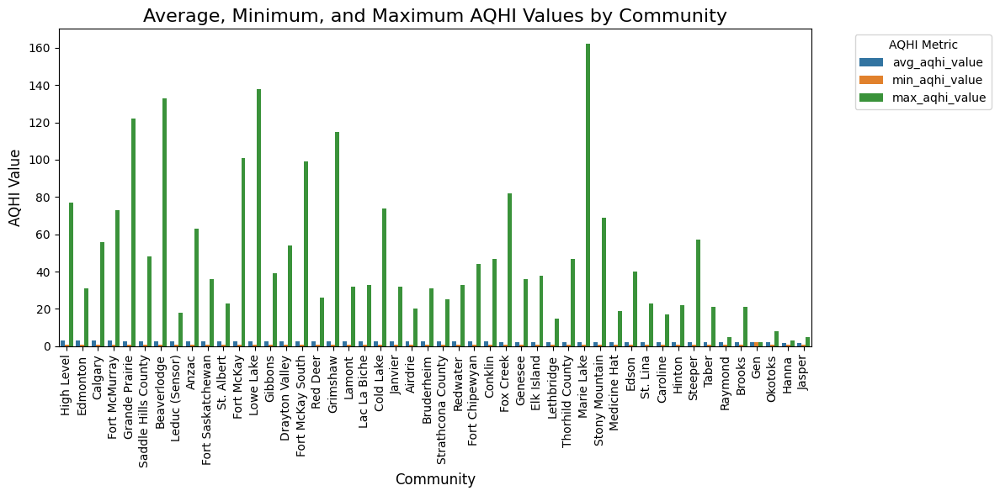

In [ ]:

df_query_5_melted = df_query_5.melt(id_vars=["CommunityName"],
                                    value_vars=["avg_aqhi_value", "min_aqhi_value", "max_aqhi_value"],
                                    var_name="AQHI_Metric", value_name="Value")

plt.figure(figsize=(12, 6))
sns.barplot(x="CommunityName", y="Value", hue="AQHI_Metric", data=df_query_5_melted)

plt.title('Average, Minimum, and Maximum AQHI Values by Community', fontsize=16)
plt.xlabel('Community', fontsize=12)
plt.ylabel('AQHI Value', fontsize=12)
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.legend(title='AQHI Metric', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside
plt.tight_layout()

plt.show()


This query calculates the average, minimum, and maximum AQHI values for each community in the dataset.

From the above graph, we can see that the Marie Lake community experienced the highest AQHI value within the given time frame. Additionally, only 5 communities in Alberta recorded an AQHI value greater than 100.

The large gap between the average and maximum AQHI values for any given community indicates that the spikes in AQHI are likely due to short-term events, such as wildfires, rather than being a consistent issue.

In [ ]:
try:
    query = """
    SELECT CommunityName, AVG(Value) AS avg_aqhi_value
    FROM aqhi_by_community
    GROUP BY CommunityName
    ORDER BY avg_aqhi_value DESC;
    """

    df_query_6 = pd.read_sql_query(query, engine)
    print(df_query_6.head())

except Exception as e:
    print(f"Error executing query: {e}")


    CommunityName  avg_aqhi_value
0      High Level        3.142379
1        Edmonton        3.030213
2         Calgary        2.975512
3   Fort McMurray        2.919700
4  Grande Prairie        2.813808


<ipython-input-104-e99892e86d58>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='CommunityName', y='avg_aqhi_value', data= df_query_6, palette='viridis')


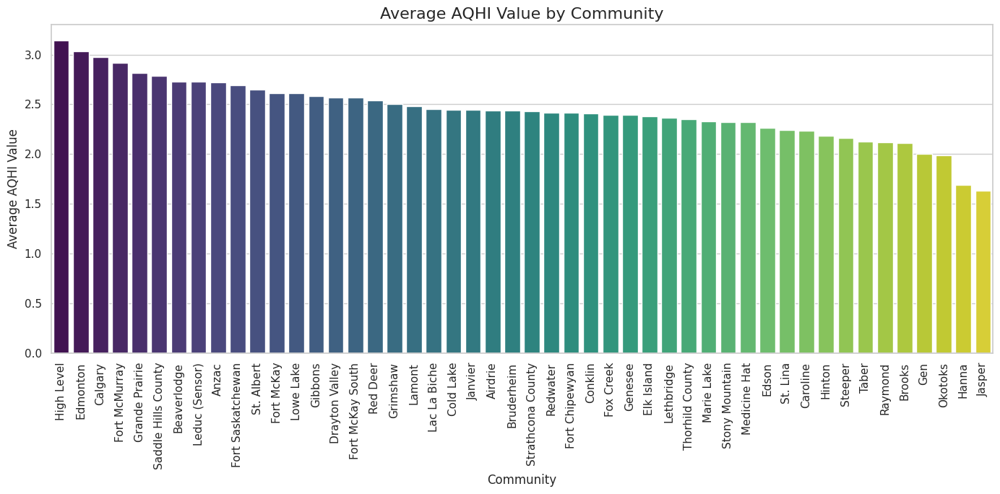

In [ ]:
plt.figure(figsize=(14, 7))

sns.barplot(x='CommunityName', y='avg_aqhi_value', data= df_query_6, palette='viridis')

plt.title('Average AQHI Value by Community', fontsize=16)
plt.xlabel('Community', fontsize=12)
plt.ylabel('Average AQHI Value', fontsize=12)

plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

The bar plot above shows the average AQHI (Air Quality Health Index) values for each community, ordered by the highest average value.


In conclusion, from the exploration of AQHI dataset, i found out that the AQHI values are generally higher during the summer months, which aligns with expectations as warmer months often see more air pollution, potentially due to increased wildfires and other environmental factors and The majority of the communities in Alberta experience low AQHI risk levels, which is promising.Communities with maximum AQHI values higher than 100 were few, These spikes are usually short-lived but can have substantial health implications.





We also connect the AQHI dataset with the historcal dataset to explore the relationship between air quality and wildfire.

In [ ]:
query = """
 select  count(distinct fire_number ,fire_year) AS fire_count,
    b.Date as date,
    Avg_value
    from `historical-wildfire` a
    right join daily_aqhi  b
    on b.Date between a.fire_start_date and a.ex_fs_date
    left join  (select Avg(DailyAvgValue) as Avg_value, Date
        from daily_aqhi
        group by Date) c
    on c.Date=b.Date
    where b.Date <"2023-12-29"
    group by b.Date,Avg_value
    order by b.Date;
"""
df = pd.read_sql_query(query, engine)
df


,fire_count,date,Avg_value
0,55,2023-11-01,2.574002
1,57,2023-11-02,2.534751
2,49,2023-11-03,2.426677
3,50,2023-11-04,2.381133
4,54,2023-11-05,2.364954
5,53,2023-11-06,2.131235
6,50,2023-11-07,1.881908
7,49,2023-11-08,1.998219
8,49,2023-11-09,1.910264
9,45,2023-11-10,1.900279


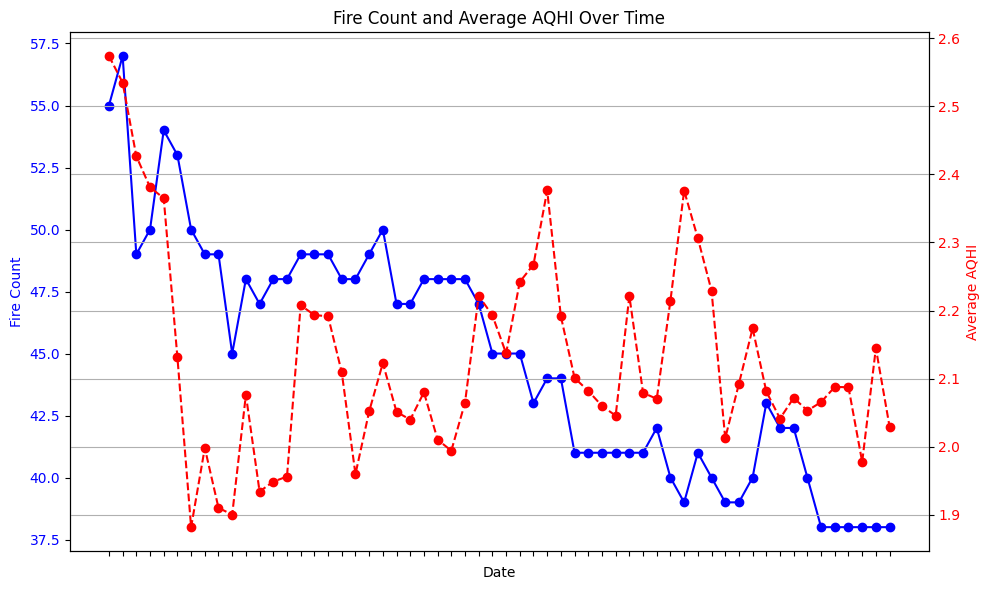

In [ ]:
fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(df['date'], df['fire_count'], marker='o', label='Fire Count', color='blue')
ax1.set_xlabel('Date')
ax1.set_ylabel('Fire Count', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax2 = ax1.twinx()
ax2.plot(df['date'], df['Avg_value'], marker='o', linestyle='--', label='Average AQHI', color='red')
ax2.set_ylabel('Average AQHI', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.title('Fire Count and Average AQHI Over Time')
ax1.set_xticklabels([])
fig.tight_layout()
plt.grid()

plt.show()

From the plot, we can see the AQHI value following the fire_count's trend at the first half, but at the later half, the relationship goes opposite side. Thus, we can not say the air quality has a strong relationship with wildfire.As we can imagine, there maybe many factors that can affect air quality.

# Disussion

**Paul** – We need to apply more efficient tools to deal with the geo data type. These data types usually are exceptionally large because of their coordinated information. Spark or any other tools like Hadoop are good to deal with this kind of data type. We use Pandas in python with chuck technique to avoid crash, but it is still lack of efficiency.  However, I learned how to use relational databases to manage these datasets with my team members. We use Azure MySQL to build the team database. It provides me with the opportunity to learn how to use cloud server databases. Overall, this project is good for me to have this hands-on experience with data management.

**Franco** - I was responsible for BUI dataset and to help analyze the causes of wildfire.

In this project I learned to split work on DB and python, as there are tasks that clearly is faster or easier to perform on than on the other.

At the beginning of the project there was a common assumption that BUI and ISI would be good indicators to predict wildfire due to how the indicators are described at Canad's portal about wildfire: https://cwfis.cfs.nrcan.gc.ca/background/summary/fwi

The huge positive outliers were kept as interpretation that it indicated very big or extreme risk of wildfires, while the zeros were handled because they were known to be missing data.

After getting poor performance on binomial exponential regression, I'd like to redo by handling the outliers and clear every assumption for the model. Some assumptions were validated but not all of them, like the extreme outliers as mentioned.

As mentioned by Paul, I'd also like to use a specialized for spatial and time series tool, like ArcGIS or QGIS.


**Yaowei Sun**-The biggest thing for me about this project is that I have fully experienced the entire workflow of Relational Database. We create databases, create tables, upload data, query and analyze, and produce results. This series of work has given me a clear understanding of the relational database.Especially when we encounter some small obstacles, such as accessing other people's databases, using certificates, sharing databases with others.These are inaccessible outside of the project and will also be very valuable experiences

**Chandanarchutha Namburu** - From this project I have thoroughly learned the SQL joins, by experimenting with the datasets. it helped me in understanding complex joins, especially when dealing with large datasets. if I were to approach this project again, I would focus more on optimising the data joining process earlier on, between the AQHI dataset and the historical wildfire dataset. one of the challenges was handling huge data and making sure of an efficient join without losing most of the data. for future work, i would explore wildfire data from other provinces to examine how smoke from wildfires in one province affects the AQHI of neighbouring provinces.


# Conclusion

## Guiding question: How much factors contribute to initiate a fire in the wilderness?

This project successfully analyzed the relationships between wildfire occurrences, the Build-Up Index (BUI), and the Initial Spread Index (ISI) across Alberta.

The overlap model pointed the locations which wildfires are most likely to happen, which demonstrates the locations which should concentrate preventive measures against wildifes in the future.

The logistic regression model demonstrated the potential to predict wildfire likelihood based on key indices and geographic data. Notably, the spatial alignment of datasets proved crucial for meaningful insights, and the analysis highlighted the value of BUI and ISI in wildfire risk assessment.

Despite some limitations, such as data inconsistencies and the need for more advanced models, this work lays a foundation for future research and practical applications in wildfire management and prevention.

## Guiding question: What are the environmental impacts of wildfire in Alberta?

Our analysis of the AQHI dataset shows a clear trend of higher AQHI values during the summer months, as seen in the "Date of Maximum AQHI Value" graph and "The AQHI valued istribution by month" graph. This aligns with the increased wildfire activity observed in Alberta, reflected in the "Monthly Wildfire Causes and Counts" graph. Although time constraints prevented a complete join of the AQHI and wildfire datasets to directly quantify the impact, the seasonal patterns in our graphs strongly suggest that wildfires have a significant influence on air quality.





# References

* 10 Data Cleaning Skills you need to know in 2024 – Dataquest. (n.d.). Retrieved October 31, 2024, from https://www.dataquest.io/blog/10-data-cleaning-skills/
* Alberta wildfire season ’10 times more severe’ than recent averages, province says | Globalnews.ca. (n.d.). Retrieved October 31, 2024, from https://globalnews.ca/news/10069300/alberta-wildfires-season-2023-record/
•	Historical wildfire data: 2006 to 2023 - Open Government. (n.d.-b). https://open.alberta.ca/opendata/wildfire-data#summary
*	Beverly, J. L., & Schroeder, D. (n.d.). Alberta’s 2023 wildfires: context, factors, and futures. Can. J. For. Res. Downloaded from Cdnsciencepub.
*	Canadian Wildland Fire Information System | Canadian Forest Fire Weather Index (FWI) System. (n.d.). Retrieved October 31, 2024, from https://cwfis.cfs.nrcan.gc.ca/background/summary/fwi
*	Global Fire Weather Indices - with default and overwintered DC startup. (n.d.). https://doi.org/10.5281/ZENODO.3626193
*	Jain, P., Coogan, S. C. P., Subramanian, S. G., Crowley, M., Taylor, S., & Flannigan, M. D. (2020). A review of machine learning applications in wildfire science and management. Environmental Reviews, 28(4), 478–505. https://doi.org/10.1139/ER-2020-0019/ASSET/IMAGES/ER-2020-0019TAB3.GIF
*	Wotton, B. M., Nock, C. A., & Flannigan, M. D. (2010). Forest fire occurrence and climate change in Canada. International Journal of Wildland Fire, 19(3). https://doi.org/10.1071/WF09002
*	Canadian Wildland Fire Information System. (n.d.). CWFIS Datamart. Natural Resources Canada, Canadian Forest Service. Retrieved in 2024. https://cwfis.cfs.nrcan.gc.ca/datamart datamart
*	Government of Alberta. (n.d.). AQI dataset. Retrieved in 2024. https://airquality.alberta.ca/map
*	  National Forestry Database. (2024). Forest Fire Data. Natural Resources Canada, Canadian Forest Service. https://nfdp.ccfm.org/en
*	Canadian Council of Forest Ministers. (n.d.). National Forestry Database. http://nfdp.ccfm.org/en/data/fires.php
*	Vitolo, C., Di Giuseppe, F., Barnard, C., & Betts, R. (2020). Global Fire Weather Indices - with default and overwintered DC startup. Zenodo. https://zenodo.org/records/3626193
*	McElhinny, Megan, et al. Global Fire Weather Indices - with Default and Overwintered DC Startup. 1.0, Zenodo, 23 Jan. 2020. Zenodo, https://doi.org/10.5281/zenodo.3626193
* ‘Regression Analysis: Simplify Complex Data Relationships’. Coursera, https://www.coursera.org/learn/regression-analysis-simplify-complex-data-relationships. Accessed 23 Nov. 2024.